<h2> appendix

In [331]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import pairwise_distances,accuracy_score
from sklearn.cluster import AgglomerativeClustering,KMeans
from scipy.spatial.distance import squareform, pdist
from scipy.stats import multivariate_normal as P
import math
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs, make_moons, make_classification , make_circles,make_s_curve
import mpl_toolkits.mplot3d 
from scipy.spatial import distance
from scipy.spatial.distance import squareform, pdist
from sklearn.neighbors import NearestNeighbors
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import Normalize


In [294]:

def get_random_covariance(d):
    """
    Function to generate a random, valid covariance matrix of size d x d
    """
    sigma = np.random.rand(d, d) - 0.5
    sigma = np.dot(sigma, sigma.T)  # make the matrix symmetric
    return sigma


def get_random_gaussian_dist(d, distance=5):
    """
     generate a random Gaussian distribution with mean mu and covariance matrix sigma
    The distance parameter specifies the distance of the mean from the origin
    """
    sigma = get_random_covariance(d)  # generate a random covariance matrix
    mu = np.array(np.random.rand(d)) * distance  # generate a random mean
    return mu, sigma


def generate_normal_datapoint(guaussian_dist):
    """
     generate a single datapoint from a Gaussian distribution with mean and covariance matrix guaussian_dist
    """
    mean = guaussian_dist[0]
    cov = guaussian_dist[1]
    dp = np.random.multivariate_normal(mean, cov, check_valid='warn', tol=1e-8)
    return dp


def generate_gaussian_cluster(guaussian_dist, k,d = 2, dataset=None):
    """
    Function to generate a cluster of k datapoints from the Gaussian distribution guaussian_dist
    The dataset parameter can be used to append the generated cluster to an existing dataset
    gauss_dist is a tuple of the form (mean, covariance matrix)
    """
    cluster = np.empty((0, d))  # initialize an empty array to store the datapoints
    for i in range(k):
        p = generate_normal_datapoint(guaussian_dist)  # generate a single datapoint
        cluster = np.append(cluster, [p], axis=0)  # add the datapoint to the cluster
    if dataset:
        dataset = np.append(dataset, cluster)  # append the cluster to an existing dataset, if provided
    return cluster


def plot_loss(loss):
    plt.figure()
    plt.plot(range(len(loss)),loss)
    plt.title("loss vs. iteration no.")
    plt.xlabel("iteration")
    plt.ylabel("|loss|")
    plt.show()

def get_rand_centroids(K,d):
    centroids = np.random.rand(K, d)
    return centroids

In [208]:
def evaluate_accuracy(predictions,labels):
    accuracy = accuracy_score(labels, predictions)
    return accuracy*100

In [295]:
def generate_clusters(k, d = 2,N =600, distance = 2):
    """
    generate k clusters of d-dimensional data

    :param k:           number of clusters
    :param d:           dimension of the data
    :param distance:    expected distance of the mean from the origin
    :return:            clusters - a list of clusters, where each cluster is a numpy array of datapoints
                        data - a numpy array of all the datapoints
                        phi - a numpy array of the priors of each cluster
                        sigma - a numpy array of the covariance matrices of each cluster
    """
    phi = np.random.rand(k)
    phi = phi/np.sum(phi)
    print(phi)

    # random distributions
    distributions = [get_random_gaussian_dist(d,distance) for i in range(k)]
    print(distributions[0])
    # generate clusters
    clusters = [generate_gaussian_cluster(distribution,int(phi[i]*N),d) for i, distribution in enumerate(distributions)]

    sigma = [distribution[1] for distribution in distributions]
    data = np.concatenate(clusters,axis=0)

    return clusters, data, phi, sigma


In [210]:
def get_gaussian_line_shape_distribution(p1,p2):
    v = p2 - p1
    v_norm = np.linalg.norm(v)
    u = v/v_norm

    sigma = v_norm * np.outer(u,u)

    epsilon = 0.005 * np.identity(sigma.shape[0])
    sigma +=epsilon

    mu = p1 + (p2 - p1)/2

    return mu, sigma



<h3> MLE


In [352]:
def E_step(data, phi, mu, sigma):
    """
       Perform E-step on GMM model
       Each datapoint will find its corresponding best cluster center
       ---
       Inputs:
            data: (n, d) array, where n is # of data points and d is # of dimensions
            phi: (k, d) array, where k is # of clusters
            mu: (k, d) array, where k is # of clusters and d is # of dimensions
            sigma: (k, d, d) array, where k is # of clusters and d is # of dimensions

       Returns:
            'w': (k,n) array indicating the cluster of each data point
                        where k is # of clusters and n is # of data points
       """
    n = len(data)
    k = len(phi)
    w = np.zeros((k, n))
    log_likelyhood = 0
    
    for i in range(n):
        norm_i = 0
        for j in range(k):
            w[j, i] = P(mu[j], sigma[j]).pdf(data[i]) * phi[j]
            norm_i += w[j, i]
        w[:, i] /= norm_i
        
        log_likelyhood -= np.log(norm_i)    # compute log-likelyhood
    return w, log_likelyhood


def M_step(data, w, phi, mu, sigma):
    """
    M-step: Update our estimate of μ, σ2 and using the new values of the latent variables z.
    Inputs:
        clusters: (n) array indicating the cluster of each data point
        data: (n, d) array, where n is # of data points and d is # of dimensions
        mu: (k, d) array, where k is # of clusters and d is # of dimensions
        sigma: (k, d, d) array, where k is # of clusters and d is # of dimensions

    Returns:
        mu: (k, d) array, where k is # of clusters and d is # of dimensions
        sigma: (k, d, d) array, where k is # of clusters and d is # of dimensions
    """
    sum_of_all_w = np.sum(w)
    # iterate over each gaussian, calculate μ, σ2:

    for j in range(len(mu)):
        sum_over_wj = np.sum(w[j])
        # μ <- (1/sum over wj) * weighted sum over all the data points
        mu[j] = np.sum(np.array([xi*w[j,i] for i, xi in enumerate(data)]), axis=0) / sum_over_wj
        # σ2 <- wheighted sum over all the data points in cluster((datapoint value - μ_new)**2)
        sigma[j] = np.sum(np.array([np.outer((xi - mu[j]).T, xi - mu[j]) * w[j, i] for i, xi in enumerate(data)]), axis=0)/sum_over_wj

        phi[j] = sum_over_wj/sum_of_all_w

    return phi, mu, sigma

# Input: data, model

def MLE(data,labels, initial_model,headline, case = 2, plot = True):
    d = data.shape[1]

    # 1. Initialize model parameters

    phi, mu, sigma = initial_model

    # 2. while not converged:
    converged = False
    i = 0
    iteration_log_likelihood = [0.0]



    while not converged and i<150:

        # 2.1     E-step: compute expected value of latent variable given current parameters
        w,lol = E_step(data , phi, mu, sigma)
        iteration_log_likelihood.append(lol)
        # 4.     M-step: update parameters to maximize expected likelihood
        if case == 1:
            PHI, SIGMA = phi, sigma
            _, mu, _ = M_step(data, w, phi, mu, sigma)
            phi, sigma = PHI, SIGMA
        if case == 2:
            phi, mu, sigma = M_step(data, w, phi, mu, sigma)
        

        i += 1
        converged = (abs(iteration_log_likelihood[i]-iteration_log_likelihood[i-1]) < 0.00001)

     # Calculate predictions for each data point
    n = data.shape[0]
    predictions = np.argmax(w, axis=0)
    if d==2:
        scatter_plt2D(data, predictions,headline )
    if d==3:
        scatter_3d(data[:,0], data[:,1], data[:,2], labels)
    # 5. return model
    return phi, mu, sigma,  iteration_log_likelihood,predictions


In [212]:
def initial_model(D,k,d,init_metod,phi, sigma):
    """

    :param c: # of Gaussians in model
    :param d: # of dimentions of datapoints

    :return: an arbitrary initial condition  model for MLE. containing:
             phi: amplitude of Gaussians, np array (k)
             mu: np array(k,d)
             sigma: covariance matrix of gausians, np aray (k,d,d)


    """
    sigmas = np.zeros((k, d, d)) 
    if init_metod=='rand':
        mu = np.array([np.random.multivariate_normal([0]*d, np.eye(d,d)) for i in range(k)])
    else:
        kmeans = KMeans(n_clusters=k, n_init=10)
        kmeans.fit(D)
        mu = kmeans.cluster_centers_

    if phi==None and sigma==None:
        phi = np.random.rand(k)
        phi /= sum(phi)
       

        for i in range(k):
            sigma = np.random.rand(d, d)
            sigma = np.dot(sigma, sigma.T)
            sigmas[i] = sigma
            

    


 
    return phi, mu, sigmas

In [213]:
def plot_log_likelihood(lol):
    plt.plot(range(len(lol[2:])),lol[2:])
    plt.title("log likelyhood vs. iteration no.")
    plt.xlabel("iteration")
    plt.ylabel("|log liklyhood|")
    plt.show()

In [214]:
def get_distance_2d(cluster_1, cluster_2, distance_metric="euclidean"):
    """Gets the distance between the two given 2D clusters.

    Args:
      cluster_1: A list of 2D data points.
      cluster_2: A list of 2D data points.
      distance_metric: The distance metric to use. Can be "euclidean" or "manhattan".

    Returns:
      The distance between the two clusters.
    """
    sum=0
    for data_point1 in cluster_1:
        for data_point_2 in cluster_2:

            if distance_metric == "euclidean":
                sum=sum+(data_point1-data_point_2)**2
            elif distance_metric == "manhattan":
                sum=sum+abs(data_point1-data_point_2)
    if distance_metric == "euclidean":
        sum=math.sqrt(sum)
    return sum

In [215]:
def find_closest_clusters_2d(clusters):
    """Finds the two closest clusters in the given list of 2D clusters.

    Args:
      clusters: A list of lists, where each inner list represents a 2D cluster.
      distance_metric: The distance metric to use. Can be "euclidean" or "manhattan".

    Returns:
      A list of two lists, where the first list is the first cluster and the second
      list is the second cluster.
    """

    closest_clusters = []
    closest_distance = float("inf")

    for cluster_1 in clusters:
        for cluster_2 in clusters:
            if cluster_1 [1] == cluster_2[1] and cluster_1 [0] == cluster_2[0]:
                continue

            dist = distance.euclidean(cluster_1, cluster_2)
            if dist < closest_distance:
                closest_distance = dist
                closest_clusters = [cluster_1, cluster_2]

    return closest_clusters



<h2>AGG

In [216]:
#agg optimal cluster via sklearn
def agg_optimal_clustering_case1(D,labels, K,headline):
    # Create an instance of AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')

    # Fit the model to your data
    clustering.fit(D)

    # Obtain the predicted labels
    predictions = clustering.labels_
    
    scatter_plt2D(data, predictions,headline )
    return predictions
def agg_optimal_clustering_case2(D, K):
    # Create an instance of AgglomerativeClustering
    clustering = AgglomerativeClustering(n_clusters=K, affinity='euclidean', linkage='ward')

    # Fit the model to your data
    clustering.fit(D)

    # Obtain the predicted labels
    predictions = clustering.labels_
    print(predictions)

    return predictions

In [217]:
class HCAGG:
    def __init__(self, data, max_clusters, linkage,  m=2,error=1e-5):
        self.u, self.centroids, self.weights = None, None, None
        self.max_clusters = max_clusters
        self.data = data
        self.m = m
        self.linkage= linkage
        self.error = error

         # Map the names of the distance functions to their implementations
        self.distance_functions = {
            'single': self.dmin,
            'complete': self.dmax,
            'average': self.davg,
            'centroid': self.dmean
        }
       
    # Implementing Euclidean distance
    def euclidean_distance(self, x1, x2):
        return np.sqrt(np.sum((x1 - x2) ** 2))

    # Single-linkage clustering (Minimum distance)
    def dmin(self,cluster1, cluster2):
        return min(self.euclidean_distance(x1, x2) for x1 in cluster1 for x2 in cluster2)

    # Complete-linkage clustering (Maximum distance)
    def dmax(self , cluster1, cluster2):
        return max(self.euclidean_distance(x1, x2) for x1 in cluster1 for x2 in cluster2)

    # Average-linkage clustering (Average distance)
    def davg(cluster1, cluster2):
        return np.mean([self.euclidean_distance(x1, x2) for x1 in cluster1 for x2 in cluster2])

    # Centroid-linkage clustering (Mean distance)
    def dmean(self ,cluster1, cluster2):
        return self.euclidean_distance(np.mean(cluster1, axis=0), np.mean(cluster2, axis=0))



    # The agglomerative hierarchical clustering algorithm
    def agglomerative_clustering(self, data, num_clusters, linkage):
        # Each data point is a separate cluster at the start
        clusters = [[point] for point in data]

        # Continue until we have the desired number of clusters
        while len(clusters) > num_clusters:
            # Find the two closest clusters
            min_distance = float('inf')
            closest_clusters = None

            for i, cluster1 in enumerate(clusters):
                for j, cluster2 in enumerate(clusters):
                        distance = self.distance_functions[linkage](cluster1, cluster2)
                        if distance < min_distance:
                            min_distance = distance
                            closest_clusters = (i, j)

            # Merge the two closest clusters
            clusters[closest_clusters[0]] += clusters[closest_clusters[1]]
            del clusters[closest_clusters[1]]

        return clusters

In [218]:
def compare_clustering(D, k,headline):
    

    # Agglomerative clustering (single linkage)
    model = AgglomerativeClustering(n_clusters=k, linkage='single')
    predictions = model.fit_predict(D)
    scatter_plt2D(D, predictions,headline+" single linkage" )
    

    # Agglomerative clustering (complete linkage)
    model = AgglomerativeClustering(n_clusters=k, linkage='complete')
    predictions = model.fit_predict(D)
    scatter_plt2D(D, predictions,headline +" complete linkage")

    # Agglomerative clustering (average linkage)
    model = AgglomerativeClustering(n_clusters=k, linkage='average')
    predictions = model.fit_predict(D)
    scatter_plt2D(D, predictions,headline +" average linkage")
    
    # Agglomerative clustering (ward linkage)
    model = AgglomerativeClustering(n_clusters=k, linkage='ward')
    predictions = model.fit_predict(D)
    scatter_plt2D(D, predictions,headline +" ward linkage")

<h2>UFOC

In [219]:
def exponential_kernel(x, y, gamma):
    return np.exp(-gamma * np.linalg.norm(x - y)**2)

def kmeans_with_exponential_kernel(data, k,cluster_centers, max_iterations=100, gamma=2.0, plot = False):
    """
    K-Means with exponential kernel
    :param data:            (N, d) nd_array of data points
    :param k:               number of clusters
    :param max_iterations:  maximum number of iterations
    :param gamma:           the exponential decay
    :return:                centroids -
                            labels -
                            loss convergence -
    """
    n_samples, n_features = data.shape

    # Initialize cluster centers randomly
    losses = []

    for iter in range(max_iterations):
        # Assign data points to the nearest cluster center
        u = np.array([np.array([exponential_kernel(x, center, gamma) for center in cluster_centers]) for x in data])
        u = u/ np.sum(u, axis=1)[:, None]

        labels = [np.argmax([exponential_kernel(x, center, gamma) for center in cluster_centers]) for x in data]
        new_cluster_centers = np.zeros((k, n_features))

        # Update cluster centers based on the mean of the data points assigned to each cluster


        # clusters.shape -> (k, n_features)
        new_cluster_centers = np.dot(u.T, data) / np.sum(u, axis=0)[:, None]


        # plot the current iteration

        if plot and (iter < 3 or not iter % 10):
            plot_clusters([data[np.array(labels) == i] for i in range(k)], title=f'iteration {iter}')
            for c in new_cluster_centers:
                plt.scatter(c[0],c[1],marker='x',s=100)

        # Check for convergence
        if np.allclose(cluster_centers, new_cluster_centers):
            break

        cluster_centers = new_cluster_centers
        loss = np.sum([-exponential_kernel(x, cluster_centers[labels[i]], gamma) for i, x in enumerate(data)])
        losses.append(loss)

    return cluster_centers, u, losses




In [245]:
def fcm(data, K, initial_centroids, max_iters = 50, fuzziness = 2, tol = 0.001, plot = False):
    """
    Classical fuzzy c-means clustering algorithm

    :param data:                ndarray of shape (N, d) where N is the number of data points and d is the dimension of the data
    :param K:                   int: number of clusters
    :param initial_centroids:   ndarray of shape (K, d) containing the initial cluster centers
    :param max_iters:           int: maximum number of iterations
    :param fuzziness:           float: fuzziness parameter
    :param tol:                 float: tolerance for convergence
    :return:                    centroids: ndarray of shape (K, d) containing the final cluster centers
                                membership: ndarray of shape (N, K) containing the membership matrix

    """
    # Randomly initialize cluster centers
    centroids = initial_centroids
    i=0
    converged = False
    iteration_loss = []
    while (not converged) and i < max_iters:
        # Calculate the membership matrix
        distances = np.linalg.norm(data[:, None] - centroids, axis=2)
        membership = 1 / (distances ** (2 / (fuzziness - 1)))
        membership = membership / np.sum(membership, axis=1)[:, None]

        # Update cluster centers
        m = membership ** fuzziness
        centroids = np.dot(m.T, data) / np.sum(m, axis=0)[:, None]

        clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

        #if plot and (i<3 or not i%10) :
        #   plot_clusters(clusters, title=f'iteration {i}')
        #   plot_centroids(centroids)

        loss = np.sum((distances**2) * m)
        iteration_loss.append(loss)

        if i >20:
            converged = (abs(loss-iteration_loss[i-1]) < tol)
        i+=1
    #plot_clusters(clusters, title=f'iteration {i}')
    #plot_centroids(centroids)

    return centroids, membership, iteration_loss

In [246]:
def WUOFC(data, K_max, cluster_validity_criteria, max_iters = 50, fuzziness = 2, tol = 0.001):
    """

    :param data:                        np.array of shape (N,d)
    :param K_max:                       int: maximal feasible number of clusters
    :param cluster_validity_criteria:   fun(list clusters) -> int :function that calculates the cluster validity criteria
    :param max_iters:                   int: maximal number of iterations
    :param fuzziness:                   int: FCM fuzziness parameter
    :param tol:                         int: tolerance parameter
    :return:
    """

    #  Initialize the cluster center c_0
    centroids = [np.mean(data, axis=0)]
    k = 1
    C =[]
    V = []
    
    while k < K_max:
        # Calculate the membership matrix

        #call FCM with K clusters and the current cluster centers c_1, ..., c_K.
        centroids, membership, loss = fcm(data,k,centroids)

        #print centroids

        # use the centroids μcx as the new cluster centers c_1, ..., c_K fo K-means with exponential kernel algorithm.
        centroids, membership, loss = kmeans_with_exponential_kernel(data, k,centroids, max_iterations=100, gamma=2.0)

        

        #add centroids to C
        C.append(centroids)

        # calculate the cluster validity criteria V for the partition.
        V.append(cluster_validity_criteria(data, centroids, membership))
        print(f'K = {k} : V = {V[-1]}')

        clusters = [data[np.argmax(membership,axis=1)==i] for i in range(k)]
        plot_clusters(clusters, title=f'K = {k}')
        plt.show()
        # add a new centroid, c_K+1 equally distant from all the other centroids, to the set of cluster centers. set K←K+1.
        k += 1
        membership = np.append(membership, np.zeros((membership.shape[0], 1)), axis=1)
        membership[:, -1] = 0.2

        # Calculate the membership matrix

        membership = membership / np.sum(membership, axis=1)[:, None]

        # Update cluster centers
        m = membership ** fuzziness
        centroids = np.dot(m.T, data) / np.sum(m, axis=0)[:, None]



    V_opt = np.argmax(np.array(V))
    
    C_opt = C[V_opt]
    return V_opt, C_opt,V

    

In [283]:
def comper_criteria_WUOFC(data, K_max,K_values):
    


    V,C,HPV1=WUOFC(data, K_max, HPV)
    plot_clusters([data],title=f'choosen clusters for fuzzy hypervolume criterion is: v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for fuzzy hypervolume criterion:')
    plt.figure()
    plt.plot( K_values,HPV1)
    plt.ylabel('1/HPV')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {HPV1[i]}')
       
 
    V,C,PD1=WUOFC(data, K_max, partition_density_criterion)
    plot_clusters([data],title=f'choosen clusters for the partition density criterion is: v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for the partition density criterion:')
    plt.figure()
    plt.plot( K_values,PD1)
    plt.ylabel('PD')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {PD1[i]}')

    V,C,APDC1=WUOFC(data, K_max, APDC_criterion)
    plot_clusters([data],title=f'choosen clusters for the average partition density using "central members" is: v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for the average partition density using "central members":')
    plt.figure()
    plt.plot( K_values,APDC1)
    plt.ylabel('APDC')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {APDC1[i]}')

    V,C,APDM1=WUOFC(data, K_max, APDmax_criterion)
    plot_clusters([data],title=f'choosen clusters for the average partition density using "maximal members": v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for the average partition density using "maximal members":')
    plt.figure()
    plt.plot( K_values,APDM1)
    plt.ylabel('APDM')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {APDM1[i]}')

    V,C,NPIR1=WUOFC(data, K_max,NPIR)
    plot_clusters([data],title=f'choosen clusters for the normalized (by k) partition indexes criteria: v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for the normalized (by k) partition indexes criteria:')
    plt.figure()
    plt.plot( K_values,NPIR1)
    plt.ylabel('1/NPIR')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {NPIR1[i]}')

    V,C,Invariant1=WUOFC(data, K_max, invariant_criterion)
    plot_clusters([data],title=f'choosen clusters for the Invariant criterion: v = {V+1}')
    plot_centroids(C,title=f'choosen cluster caenters for the Invariant criterion:')
    plt.figure()
    plt.plot( K_values,Invariant1)
    plt.ylabel('Invariant')
    plt.xlabel('k')
    plt.show()
    for i in range(K_max-1):
        print(f'K = {i+1} : V = {Invariant1[i]}')

trace criteria

In [223]:
def trace_criterion(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape[1]

    clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    V = 0
    for k in range(K):
        S_i = np.cov(clusters[k].T)
        V += np.trace(S_i)*(clusters[k].shape[0])
    return V*K


fuzzy hypervolume criterion

In [224]:
def HPV(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape[1]

    clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    V=0
    for c in clusters:
        S_i = np.cov(c.T)

        h_k = np.linalg.det(S_i) * (1/c.shape[0])
        V += h_k
    return 1/(V * K)

In [225]:
def Fuzzy_covariance(data, centroid, membership):
    """
    :param data:
    :param centroids:
    :param membership:
    :return:
    """
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape
    distances = np.array([(centroid - d) for d in data])

    d_dT = np.array([membership[i]* np.outer(d,d) for i, d in enumerate(distances)])


    F_k = np.sum(d_dT, axis=0)

    F_k = F_k / np.sum(membership)
    return F_k


the partition density criterion:

In [226]:
def partition_density_criterion(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape[1]

    clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    #TODO : is it the sum on membership or clusters??
    # b_k = np.array([c.shape[0]for c in clusters])
    b_k = np.sum(np.array(membership))

    F = [Fuzzy_covariance(data, centroids[k], membership[:,k]) for k in range(K)]

    h_k = np.zeros(K)
    for i,c in enumerate(clusters):
        S_i = np.cov(c.T)
        h_k[i] = np.sqrt(np.linalg.det(F[i]) )


    V = np.sum(b_k) / np.sum(h_k)
    return V

the average partition density using "central members":

In [227]:
def APDC_criterion(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape[1]

    print(f'current K = {K}')
    # clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    #TODO : is it the sum on membership or clusters??
    # c_k = np.array([c.shape[0]for c in clusters])
    c_k = np.sum(np.array(membership))

    F = [Fuzzy_covariance(data, centroids[k], membership[:,k]) for k in range(K)]

    h_k =np.array([np.sqrt(np.linalg.det(F[k])) for k in range(K)])

    V = (1/K) * np.sum(c_k/h_k)
    return V

the average partition density using "maximal members":

In [228]:
def APDmax_criterion(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    membership = np.array(membership)
    K = membership.shape[1]

    print(f'current K = {K}')
    clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    max_membership = np.array([c.shape[0] for c in clusters])
    #TODO : is it the sum on membership or clusters??

    F = [Fuzzy_covariance(data, centroids[k], membership[:,k]) for k in range(K)]

    h_k =np.array([np.sqrt(np.linalg.det(F[k])) for k in range(K)])

    V = (1/K) * np.max(max_membership/h_k)
    return V

the normalized (by k) partition indexes criteria:

In [229]:
def NPIR(data, centroids, membership):
    NPIR = 0
    b = 2
    k = centroids.shape[0]

    for i in range(k):
        diff = np.exp(np.linalg.norm(centroids[i, :] - data))
        NPIR += np.sum(np.sum((membership[:, i] ** b) * np.dot(diff, diff.T)))

    NPIR *= k

    return 1/NPIR

the Invariant criterion

In [230]:
def invariant_criterion(data, centroids, membership):
    # calculate the covariance matrix for each cluster
    if centroids.shape[0] == 1:
        return np.inf

    #centroids = centroids.reshape(1,-1)
    membership = np.array(membership)
    K = membership.shape[1]

    clusters = [data[np.argmax(membership,axis=1)==i] for i in range(K)]

    V=0
    #print datapoint shape

    S_w = np.sum([np.cov(c.T) for c in clusters],axis=0)
    # cov between centers
    S_B = np.cov(centroids.T)
    # s_w^-1 * S_B
    S = np.linalg.inv(S_w) @ S_B

    # V = np.sum(np.linalg.eig(S))

    V = np.trace((np.linalg.inv(S_w)@ S_B))

    return V * K

<h2>PLOT

In [327]:
def scatter_hist(x, y, ax, ax_histx, ax_histy, labels):
    # no labels
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    # the scatter plot:
    scatter=ax.scatter(x, y, s=40, c=labels, edgecolor='k')
    ax.set_aspect(1.)
    
    # now determine nice limits by hand:
    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)))
    lim = (int(xymax/binwidth) + 1) * binwidth
    bins = np.arange(-lim, lim + binwidth, binwidth)

    unique_labels = np.unique(labels)
    array_length = len(unique_labels)
    x1 = [[] if i == 0 else [] for i in range(array_length)]
    y1 = [[] if i == 0 else [] for i in range(array_length)]
    for i in range(len(labels)):
        for l in range(len(unique_labels)):
            if unique_labels[l] == labels[i]:
                x1[l].append(x[i])
                y1[l].append(y[i])
    legend_handles = []
    for label in range(len(unique_labels)):
        legend_handles.append(scatter.legend_elements()[0][label])
    ax.legend(legend_handles, unique_labels, title='Labels')

    # Plot KDE curves
    # Plot histograms
    for i in range(len(unique_labels)):
        ax_histx.hist(x1[i], bins=bins, color=scatter.cmap(scatter.norm(unique_labels[i])),edgecolor='k')
        ax_histy.hist(y1[i], bins=bins, orientation='horizontal', color=scatter.cmap(scatter.norm(unique_labels[i])),edgecolor='k')

        # Plot KDE curves
       # sns.kdeplot(x1[i], ax=ax_histx, color=scatter.cmap(scatter.norm(unique_labels[i])))
      #  sns.kdeplot(y1[i], ax=ax_histy, color=scatter.cmap(scatter.norm(unique_labels[i])))

        # Compute mean and variance
        x_mean = np.mean(x1[i])
        x_var = np.var(x1[i])
        y_mean = np.mean(y1[i])
        y_var = np.var(y1[i])

    # Annotate mean and variance
    ax_histx.text(x_mean, -2, f"Mean: {x_mean:.2f}\nVar: {x_var:.2f}", ha='center', va='bottom', color='red',bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))
    ax_histy.text(-1, y_mean, f"Mean: {y_mean:.2f}\nVar: {y_var:.2f}", ha='left', va='center', color='red',bbox=dict(facecolor='white', edgecolor='black', boxstyle='round'))

    #ax_histx.hist(x, bins=bins)
    #ax_histy.hist(y, bins=bins, orientation='horizontal')

    # Set labels for components
    ax.set_xlabel('x')
    ax.set_ylabel('y')

    # Set labels for histograms
    ax_histx.set_ylabel('Probability Density')
    ax_histy.set_xlabel('Probability Density')
    

In [332]:
def scatter_plt2D(data, pred,headline):
    # Start with a square Figure.
    fig = plt.figure(figsize=(6, 6))
    # Add a gridspec with two rows and two columns and a ratio of 1 to 4 between
    # the size of the marginal axes and the main axes in both directions.
    # Also adjust the subplot parameters for a square plot.
    gs = fig.add_gridspec(2, 2,  width_ratios=(4, 1), height_ratios=(1, 4),
                          left=0.1, right=0.9, bottom=0.1, top=0.9,
                          wspace=0.05, hspace=0.05)
    # Create the Axes.
    ax = fig.add_subplot(gs[1, 0])
    ax_histx = fig.add_subplot(gs[0, 0], sharex=ax)
    ax_histy = fig.add_subplot(gs[1, 1], sharey=ax)
    # Draw the scatter plot and marginals.
    scatter_hist(data[:,0], data[:,1], ax, ax_histx, ax_histy, pred)
    
    fig.suptitle(headline)
    plt.show()


In [316]:
def plot_clusters_3d(clusters):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    colors = ['blue', 'green', 'red']  # Add more colors if needed
    
    for idx, cluster in enumerate(clusters):
        color = colors[idx % len(colors)]
        ax.scatter(cluster[:, 0], cluster[:, 1], cluster[:, 2], c=color, marker='o', label=f'Cluster {idx+1}')
    
    ax.set_xlabel('X Label')
    ax.set_ylabel('Y Label')
    ax.set_zlabel('Z Label')
    ax.legend()
    
    plt.show()

In [360]:
def scatter_hist_3d(x, y, z, ax, ax_histx, ax_histy, labels):
    ax_histx.tick_params(axis="x", labelbottom=False)
    ax_histy.tick_params(axis="y", labelleft=False)

    norm = Normalize(vmin=np.min(labels), vmax=np.max(labels))
    scatter = ax.scatter(x, y, z, s=40, c=labels, edgecolor='k', norm=norm)
    ax.set_box_aspect((1, 1, 1))

    binwidth = 0.25
    xymax = max(np.max(np.abs(x)), np.max(np.abs(y)), np.max(np.abs(z)))
    lim = (int(xymax/binwidth) + 1) * binwidth
    bins = np.arange(-lim, lim + binwidth, binwidth)

    unique_labels = np.unique(labels)
    array_length = len(unique_labels)
    x1 = [[] if i == 0 else [] for i in range(array_length)]
    y1 = [[] if i == 0 else [] for i in range(array_length)]
    z1 = [[] if i == 0 else [] for i in range(array_length)]
    for i in range(len(labels)):
        for l in range(len(unique_labels)):
            if unique_labels[l] == labels[i]:
                x1[l].append(x[i])
                y1[l].append(y[i])
                z1[l].append(z[i])
    legend_handles = []
    for label in range(len(unique_labels)):
        legend_handles.append(scatter.legend_elements()[0][label])
    ax.legend(legend_handles, unique_labels, title='Labels')

    for i in range(len(unique_labels)):
        ax_histx.hist(x1[i], bins=bins, color=scatter.cmap(norm(unique_labels[i])), edgecolor='k')
        ax_histy.hist(y1[i], bins=bins, orientation='horizontal', color=scatter.cmap(norm(unique_labels[i])), edgecolor='k')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    ax_histx.set_ylabel('Probability Density')
    ax_histy.set_xlabel('Probability Density')

def scatter_plt3D(data, pred, headline):
    fig = plt.figure(figsize=(10, 8))
    gs = fig.add_gridspec(2, 2, width_ratios=(4, 1), height_ratios=(1, 4),
                          left=0.1, right=0.9, bottom=0.1, top=0.9,
                          wspace=0.05, hspace=0.05)

    ax = fig.add_subplot(gs[1, 0], projection='3d')
    ax_histx = fig.add_subplot(gs[0, 0])
    ax_histy = fig.add_subplot(gs[1, 1])

    scatter_hist_3d(data[:, 0], data[:, 1], data[:, 2], ax, ax_histx, ax_histy, pred)

    fig.suptitle(headline)
    plt.show()

In [250]:
def plot_clusters(clusters, d = 2,title = None):

    """
    Function to plot the clusters
    input: clusters - a list of clusters, where each cluster is a numpy array of datapoints
           d - the dimension of the data
    output: a plot of the clusters, where each cluster is a different color, and the datapoints are transparent to show overlapping clusters

    """
    plt.figure()
    if d == 2:
        for c in clusters:
            plt.scatter(c[:,0], c[:, 1], alpha=0.5,edgecolor='k')
    else:
        for c in clusters:
            ax = plt.axes(projection='3d')
            ax.scatter3D(c[:,0], c[:, 1], c[:, 2], alpha=0.5,edgecolor='k')
    if title:
        plt.title(title)
    


def plot_centroids(centroids, d = 2,title = None):
    """
    Function to plot the centroids
    input: centroids - a numpy array of centroids
           d - the dimension of the data
    output: a plot of the centroids, where each centroid is a different color

    """
    if d == 2:
        for c in centroids:
            plt.scatter(c[0],c[1],marker='x',s=100,edgecolor='k')
    else:
        for c in centroids:
            ax.scatter3D(c[0], c[1], c[2], marker='x', s=100,edgecolor='k')
    


<h2>2D gaussian data with two center

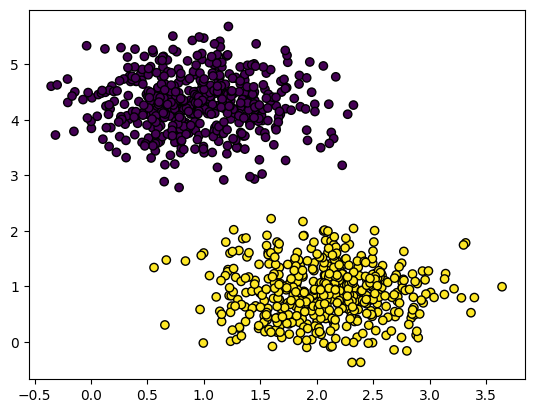

In [248]:
k=2
d=2
data, labels = make_blobs(n_samples=1000, centers=k, cluster_std=0.5, random_state=0, n_features=d)

#colors = np.random.rand(N)
plt.scatter(data[:, 0], data[:, 1], c=labels, edgecolor='k')


mle estimation using random initialization:

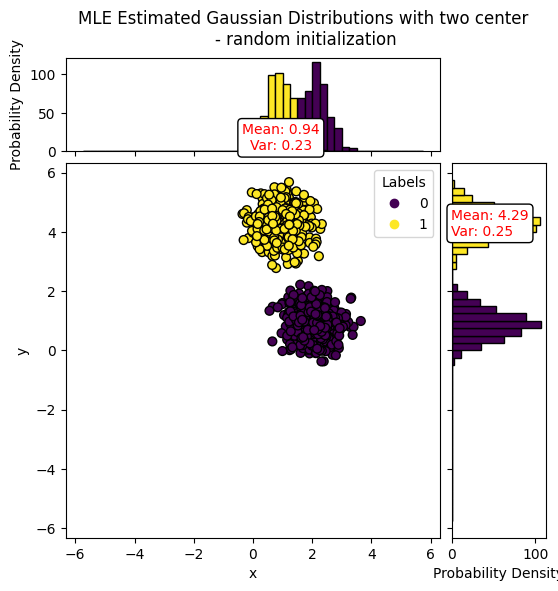

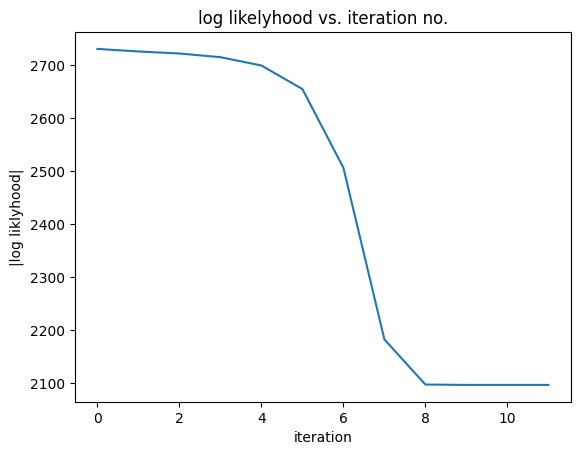

In [190]:
init = initial_model(data,k,d,'rand',phi=None,sigma=None)
phi, mu, sigma, lol ,pred= MLE(data,labels,init,'MLE Estimated Gaussian Distributions with two center \n- random initialization',case=1)
plot_log_likelihood(lol)

mle estimation using KNN initialization:

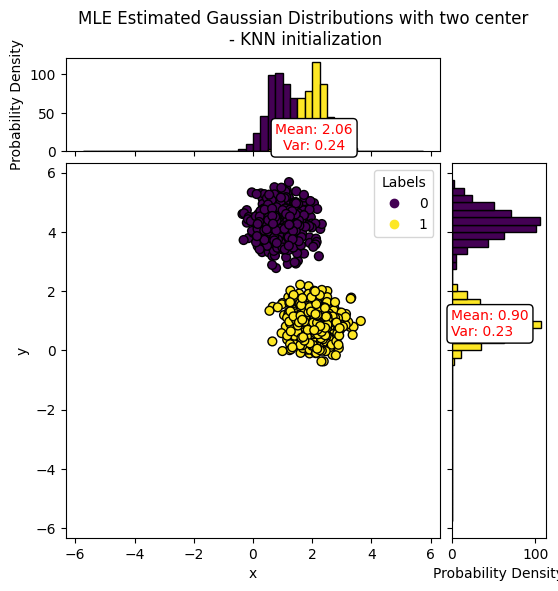

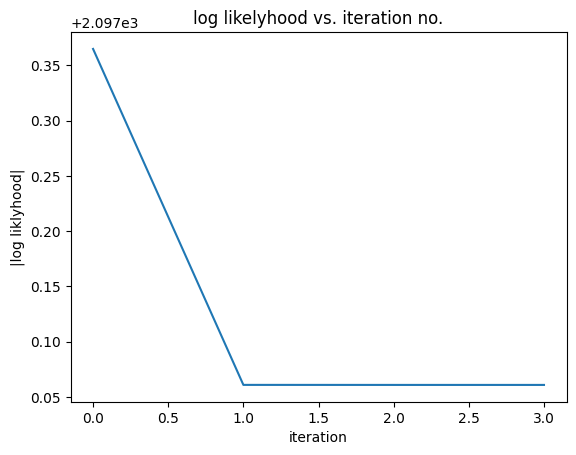

In [191]:
init = initial_model(data,k,d,'knn',phi=None,sigma=None)
phi, mu, sigma, lol ,pred= MLE(data,labels,init,'MLE Estimated Gaussian Distributions with two center \n- KNN initialization',case=1)
plot_log_likelihood(lol)

agg clustering

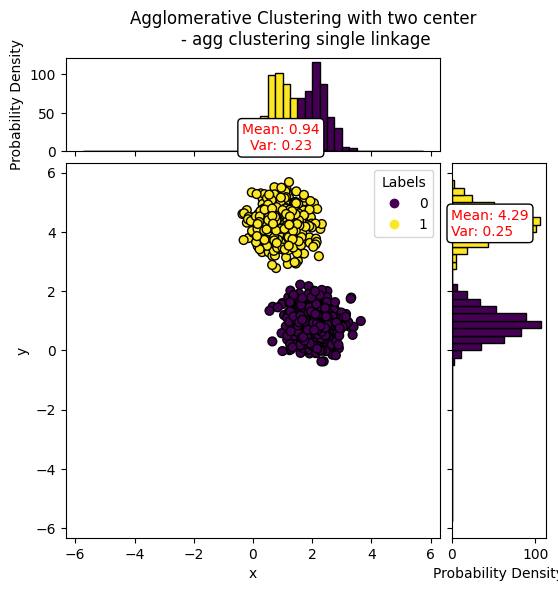

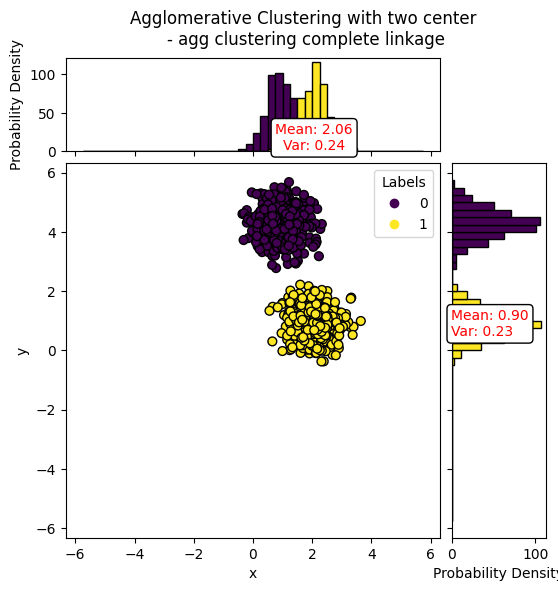

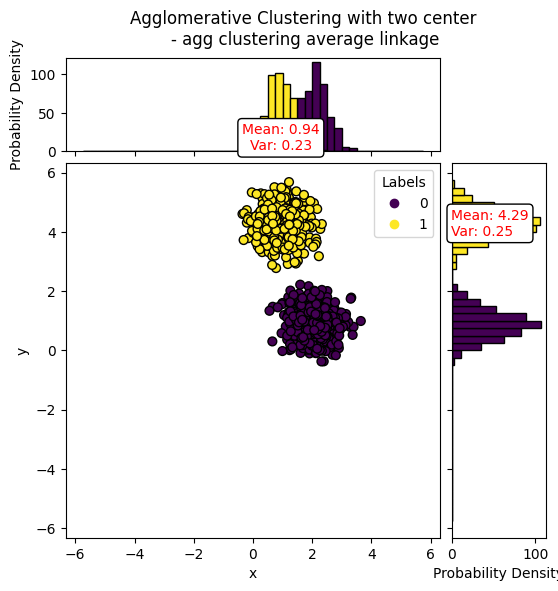

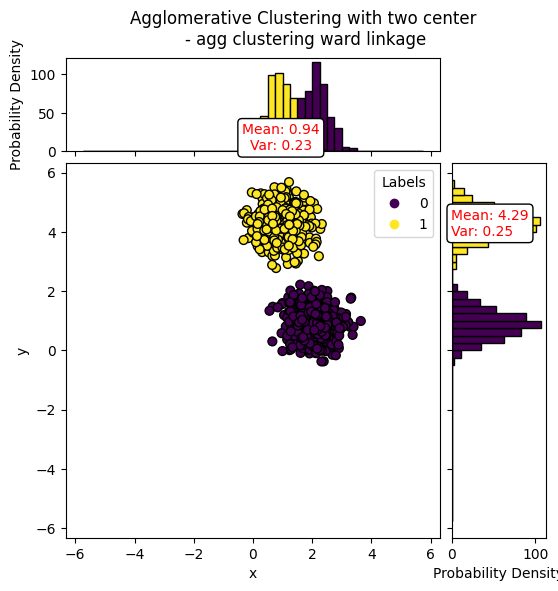

In [192]:
#pred4 = agg_optimal_clustering_case1(data, labels, k, "Agglomerative Clustering with two center \n- agg clustering")
compare_clustering(data,k,"Agglomerative Clustering with two center \n- agg clustering")

UFOC

K = 1 : V = 1237.927253471511


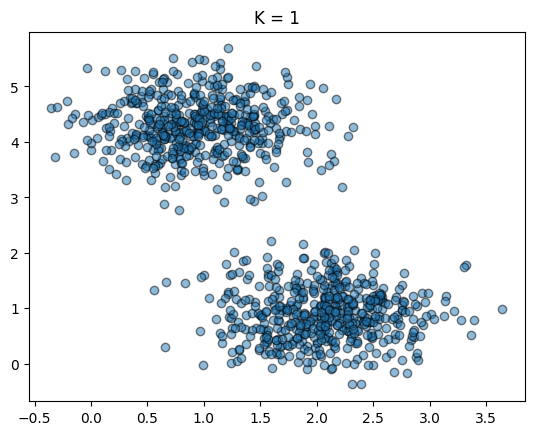

K = 2 : V = 2190.5318029925597


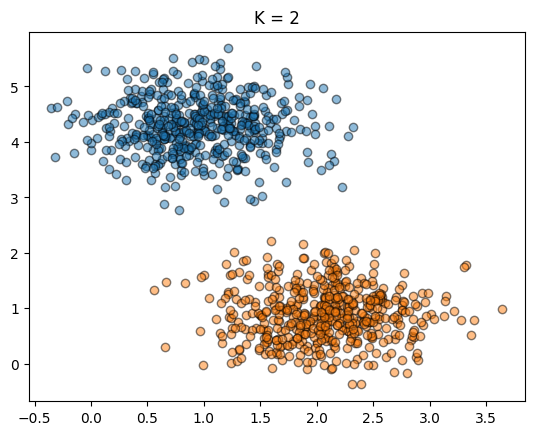

K = 3 : V = 1152.1380128099665


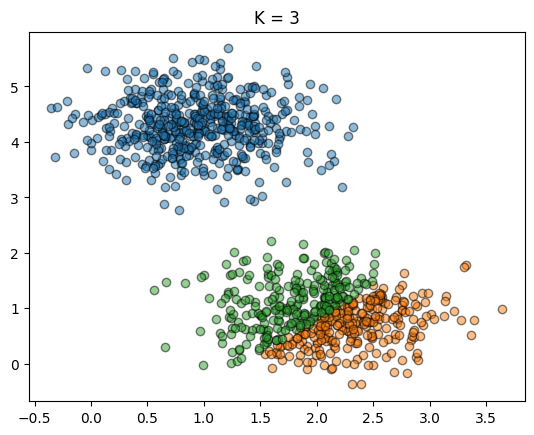

K = 4 : V = 713.4031783018887


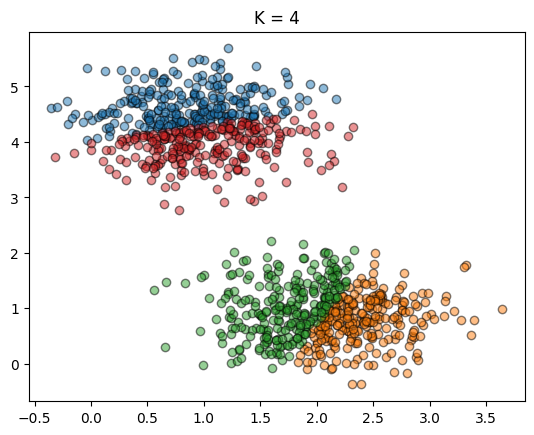

K = 5 : V = 563.0123441722337


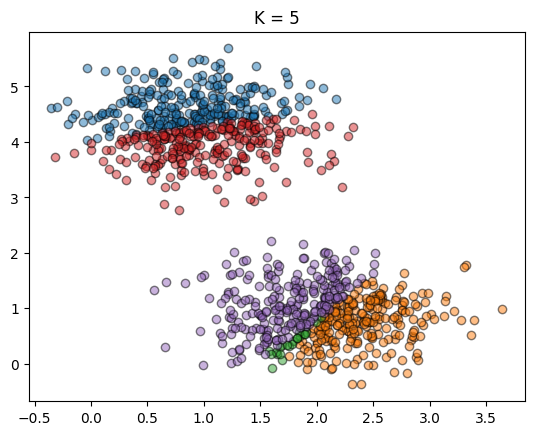

C:\Users\User\AppData\Local\Temp\ipykernel_12408\4014683696.py:33: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(c[0],c[1],marker='x',s=100,edgecolor='k')


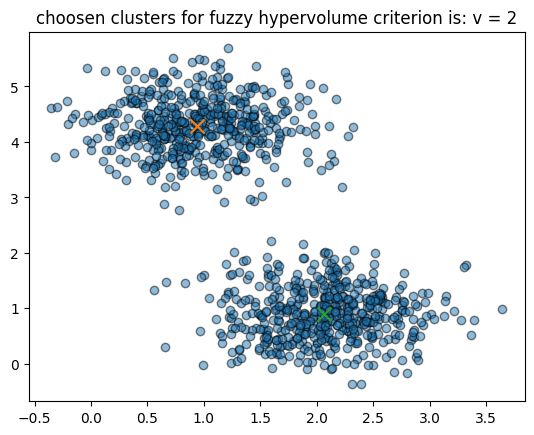

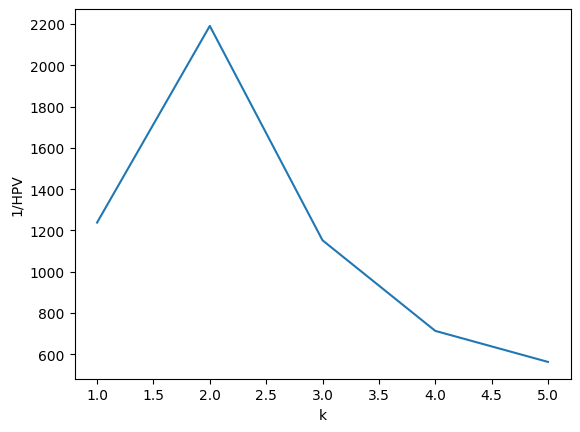

K = 1 : V = 1237.927253471511
K = 2 : V = 2190.5318029925597
K = 3 : V = 1152.1380128099665
K = 4 : V = 713.4031783018887
K = 5 : V = 563.0123441722337
K = 1 : V = 1113.735528174496


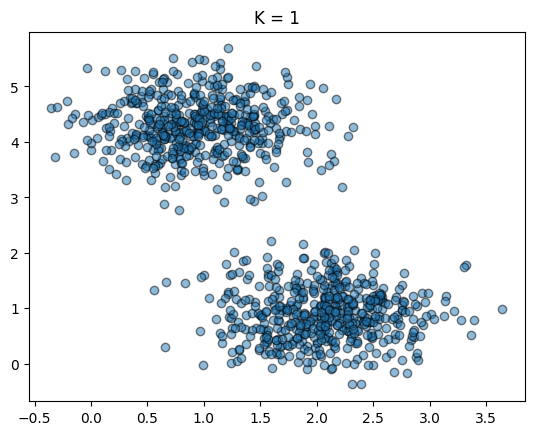

K = 2 : V = 2096.9995808008257


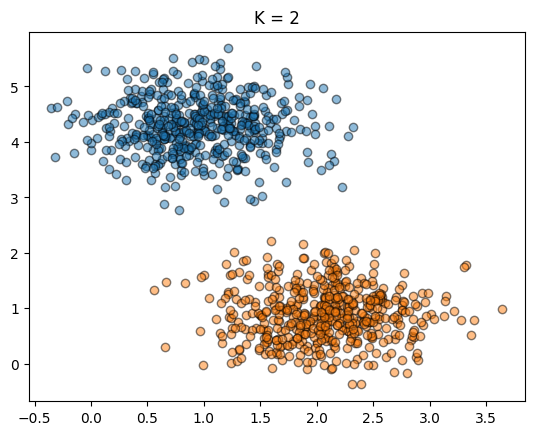

K = 3 : V = 1403.050066070005


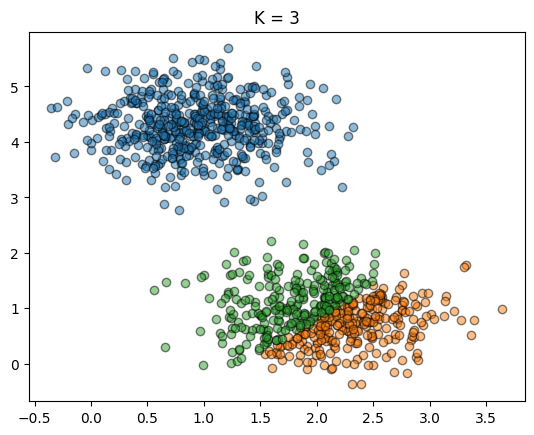

K = 4 : V = 1049.0384687726885


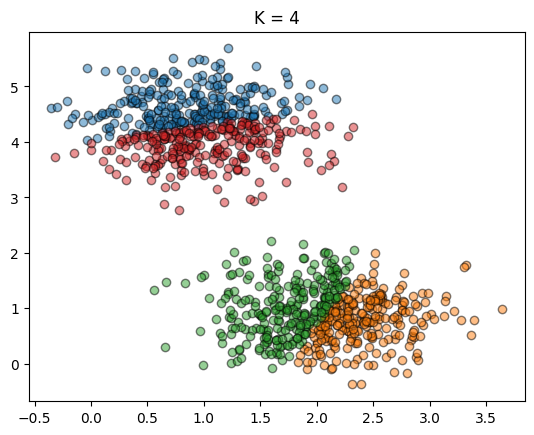

K = 5 : V = 840.959220175678


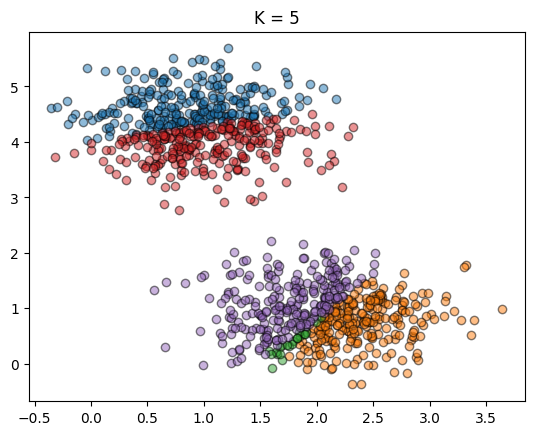

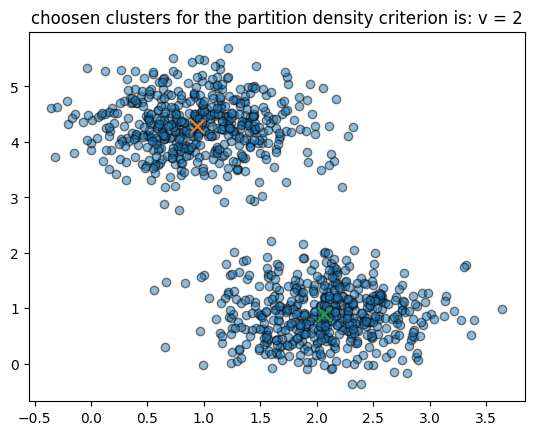

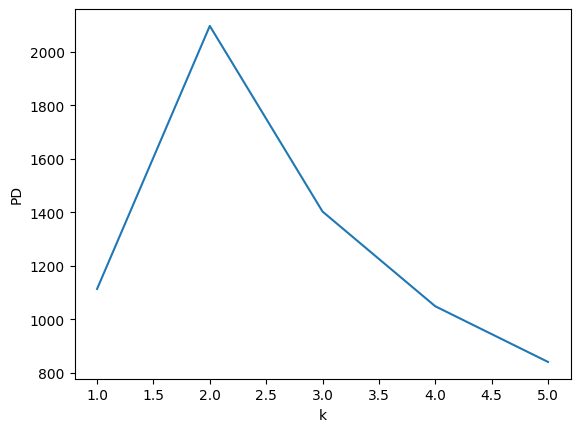

K = 1 : V = 1113.735528174496
K = 2 : V = 2096.9995808008257
K = 3 : V = 1403.050066070005
K = 4 : V = 1049.0384687726885
K = 5 : V = 840.959220175678
current K = 1
K = 1 : V = 1113.735528174496


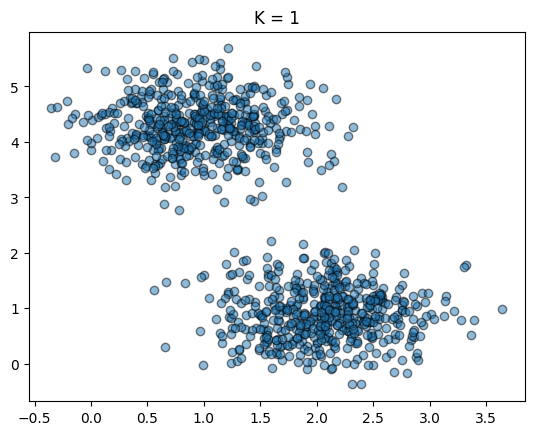

current K = 2
K = 2 : V = 4194.570517676782


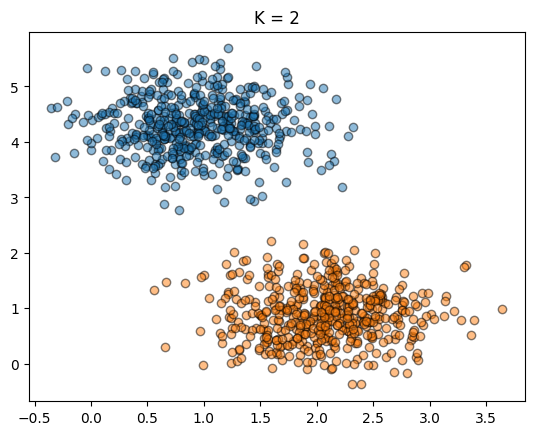

current K = 3
K = 3 : V = 4209.623280541689


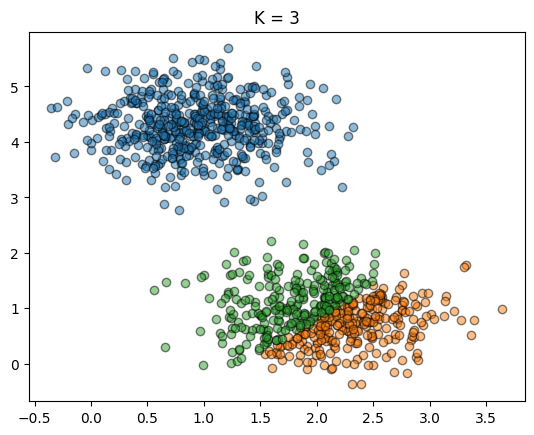

current K = 4
K = 4 : V = 4196.693703911496


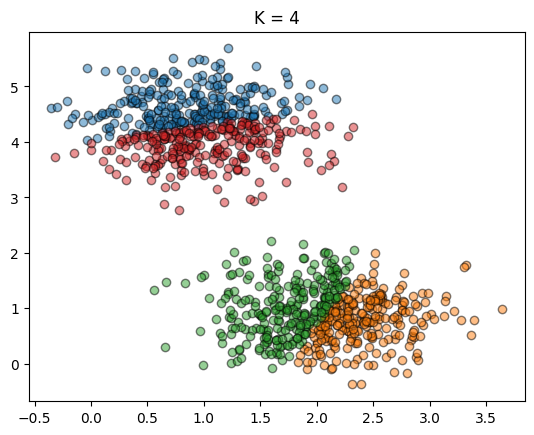

current K = 5
K = 5 : V = 4205.298636399211


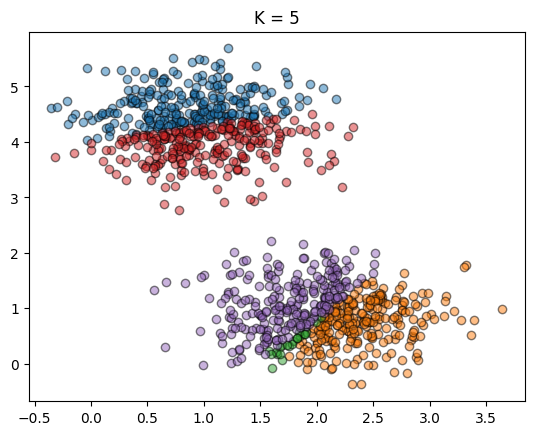

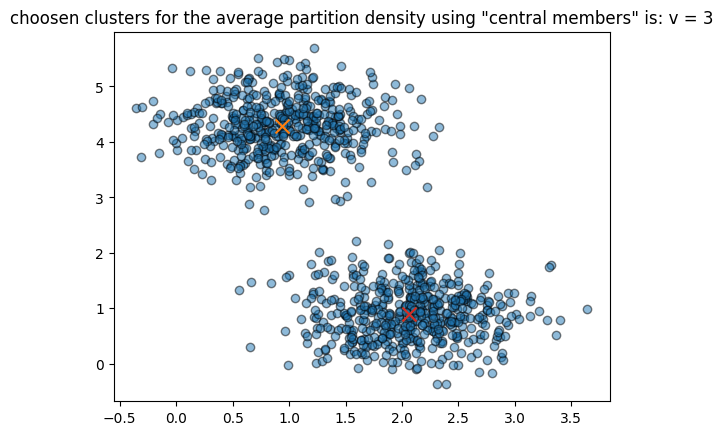

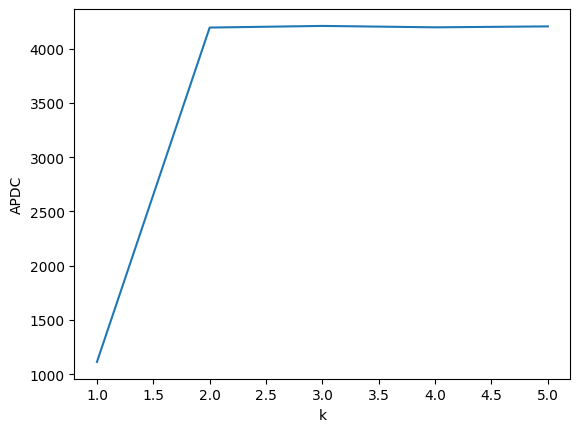

K = 1 : V = 1113.735528174496
K = 2 : V = 4194.570517676782
K = 3 : V = 4209.623280541689
K = 4 : V = 4196.693703911496
K = 5 : V = 4205.298636399211
current K = 1
K = 1 : V = 1113.735528174496


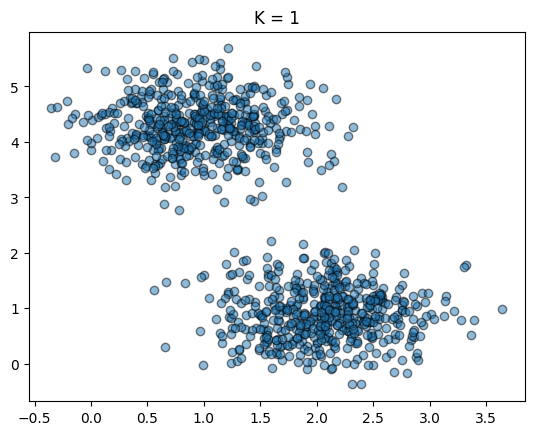

current K = 2
K = 2 : V = 1060.8813827968831


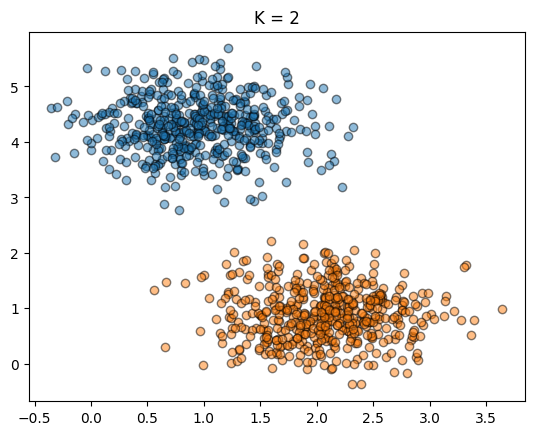

current K = 3
K = 3 : V = 691.1250650905151


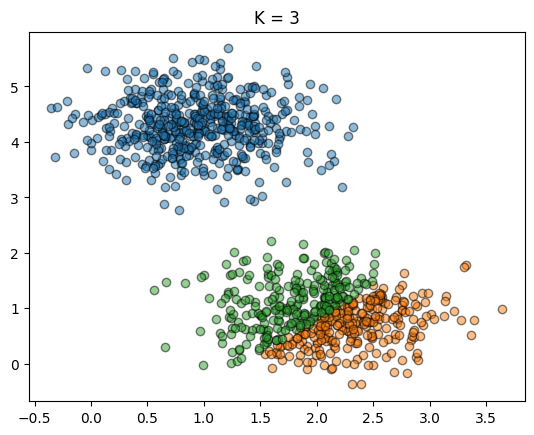

current K = 4
K = 4 : V = 268.3804816313834


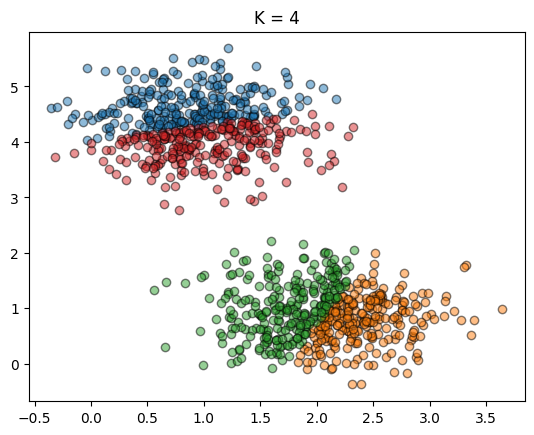

current K = 5
K = 5 : V = 207.78666367608537


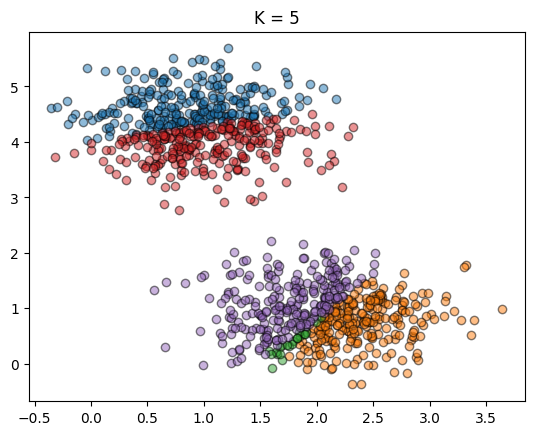

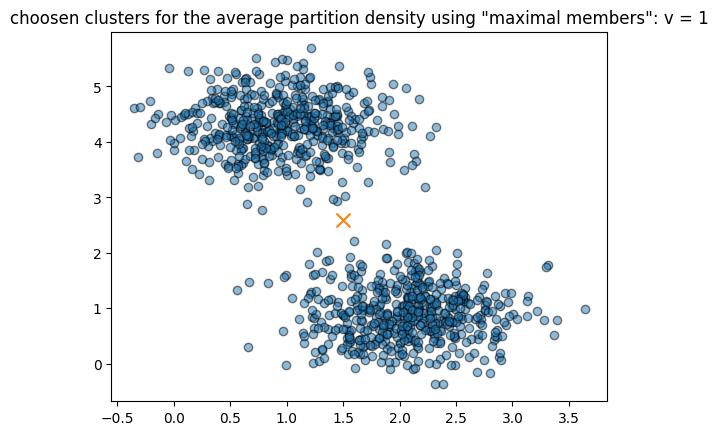

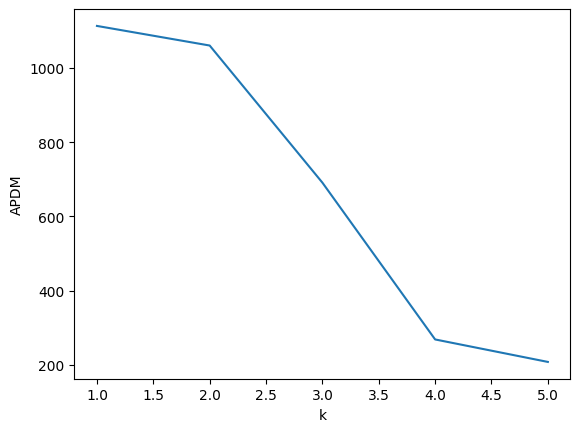

K = 1 : V = 1113.735528174496
K = 2 : V = 1060.8813827968831
K = 3 : V = 691.1250650905151
K = 4 : V = 268.3804816313834
K = 5 : V = 207.78666367608537
K = 1 : V = 2.381622473906959e-56


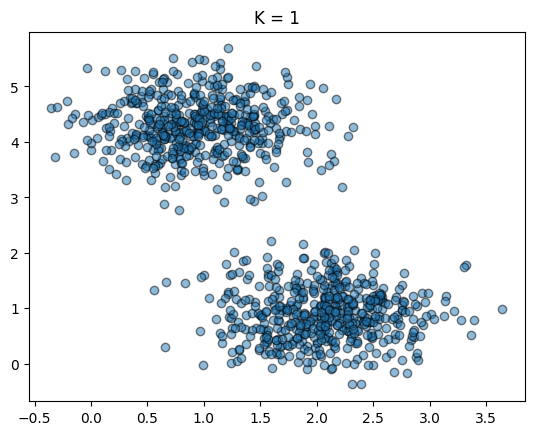

K = 2 : V = 5.459936670860444e-76


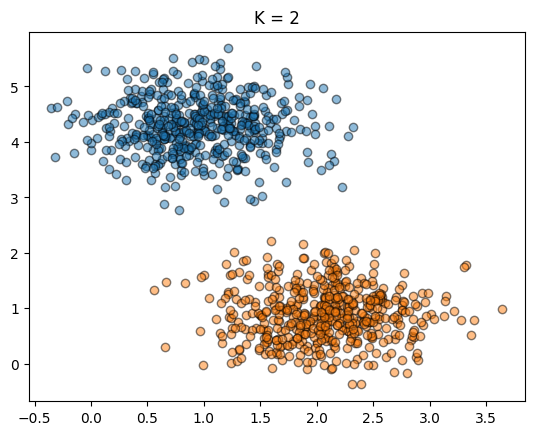

K = 3 : V = 4.8434230150888974e-76


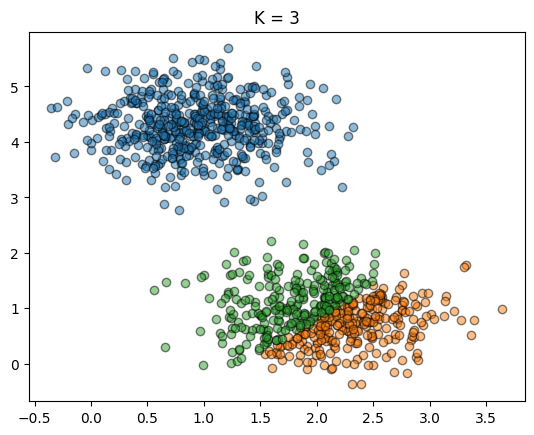

K = 4 : V = 4.343917274494395e-76


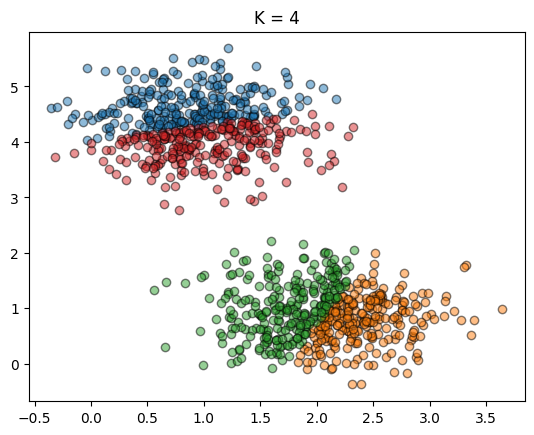

K = 5 : V = 4.1717447729584524e-76


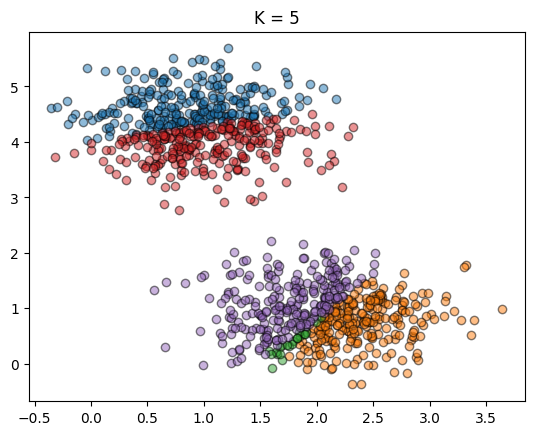

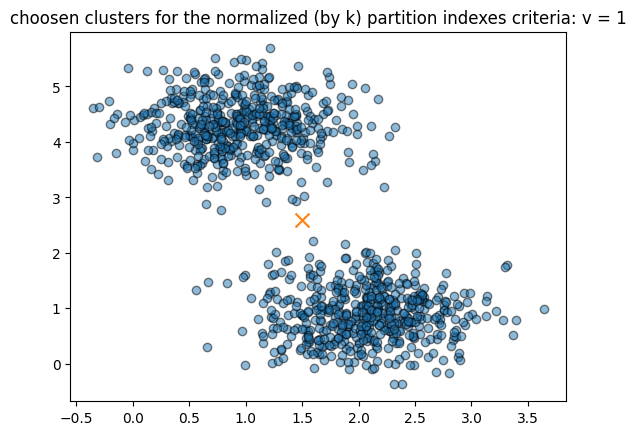

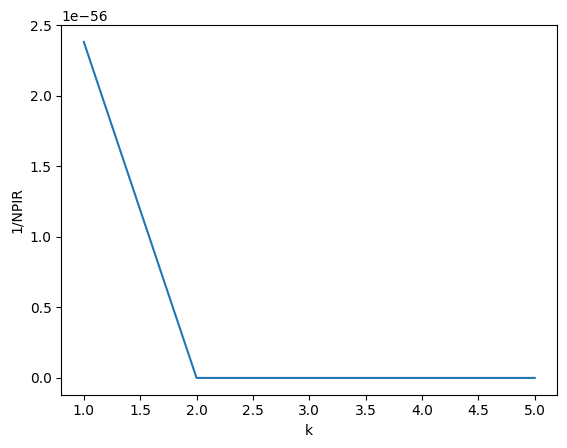

K = 1 : V = 2.381622473906959e-56
K = 2 : V = 5.459936670860444e-76
K = 3 : V = 4.8434230150888974e-76
K = 4 : V = 4.343917274494395e-76
K = 5 : V = 4.1717447729584524e-76
K = 1 : V = inf


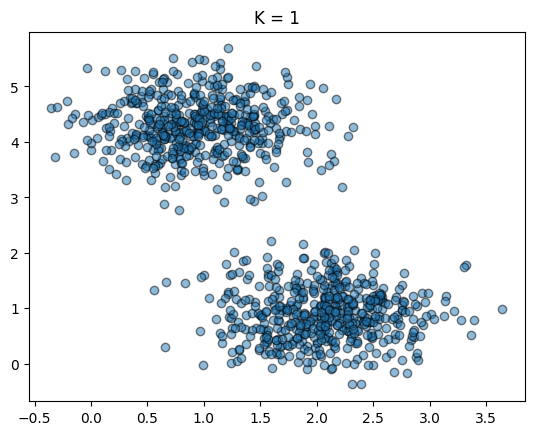

K = 2 : V = 26.31042041969481


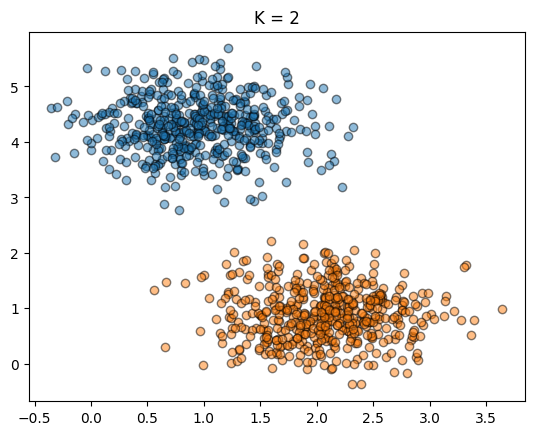

K = 3 : V = 25.951633960972888


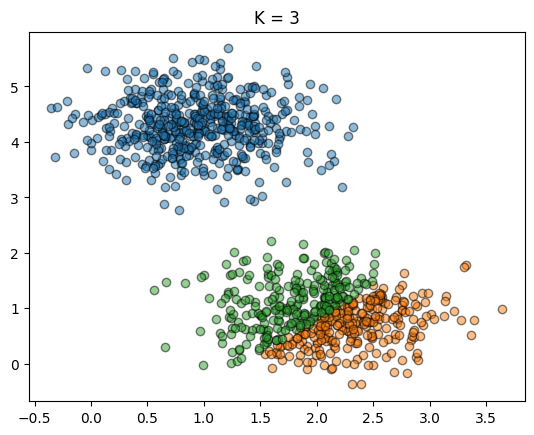

K = 4 : V = 32.09136023466212


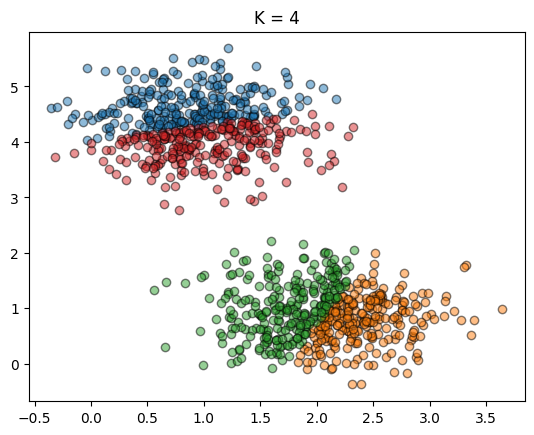

K = 5 : V = 38.348801514116445


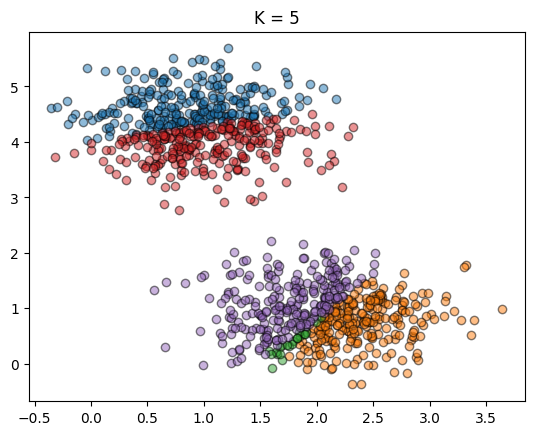

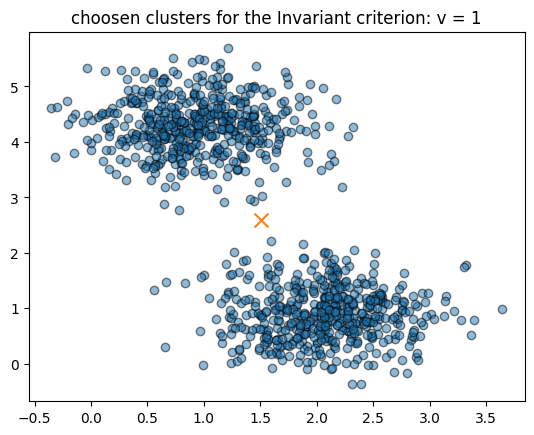

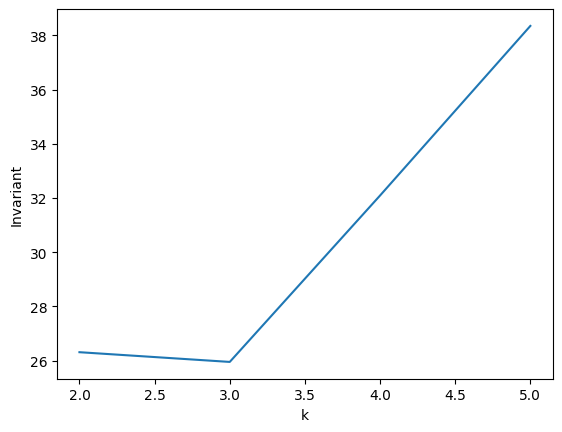

K = 1 : V = inf
K = 2 : V = 26.31042041969481
K = 3 : V = 25.951633960972888
K = 4 : V = 32.09136023466212
K = 5 : V = 38.348801514116445


In [278]:
comper_criteria_WUOFC(data, 6,[1,2,3,4,5])

<h2>2D gaussian date with multiple centers

mle estimation with random initialization

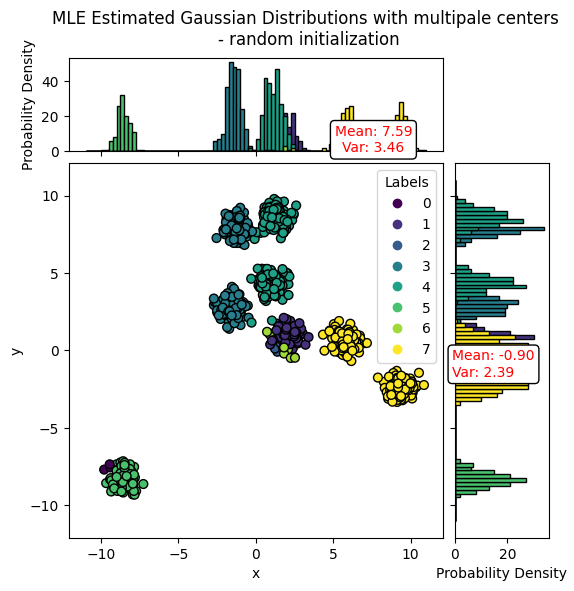

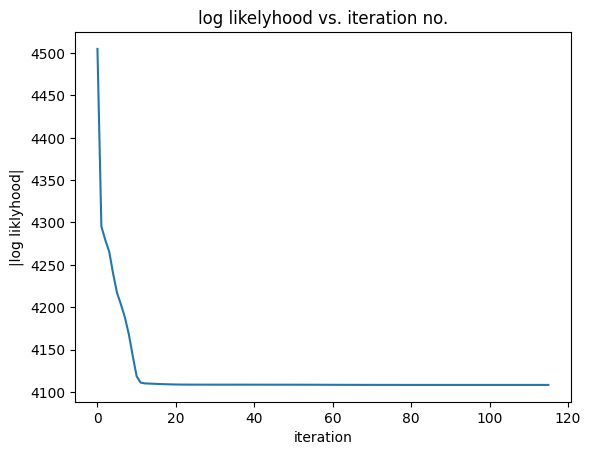

In [253]:
k=8
d=2
multiple_data, multiple_labels = make_blobs(n_samples=1000, centers=k, cluster_std=0.5, random_state=0, n_features=d)
init1 = initial_model(multiple_data,k, d, 'rand', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(multiple_data,multiple_labels, init1,'MLE Estimated Gaussian Distributions with multipale centers \n- random initialization', case=1)
plot_log_likelihood(lol1)
#doesnt always work

mle estimation with KNN initialization

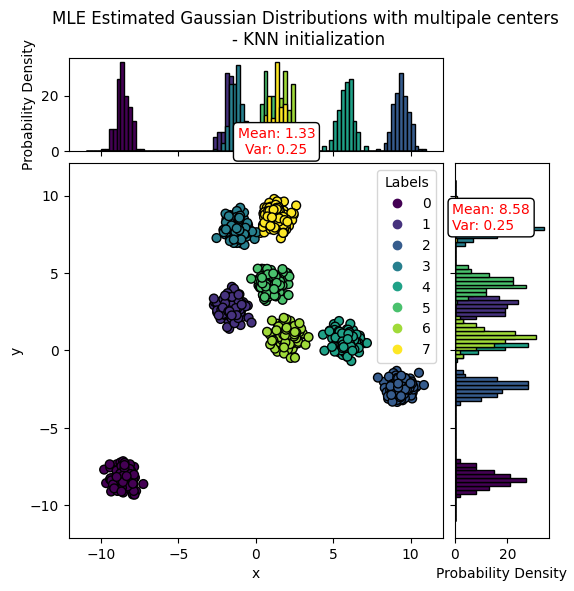

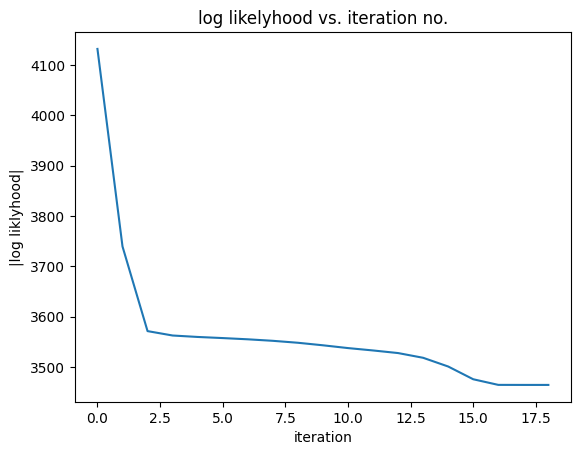

In [254]:
init1 = initial_model(multiple_data,k, d, 'knn', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(multiple_data,multiple_labels, init1,'MLE Estimated Gaussian Distributions with multipale centers \n- KNN initialization', case=1)
plot_log_likelihood(lol1)
################


agg clustering

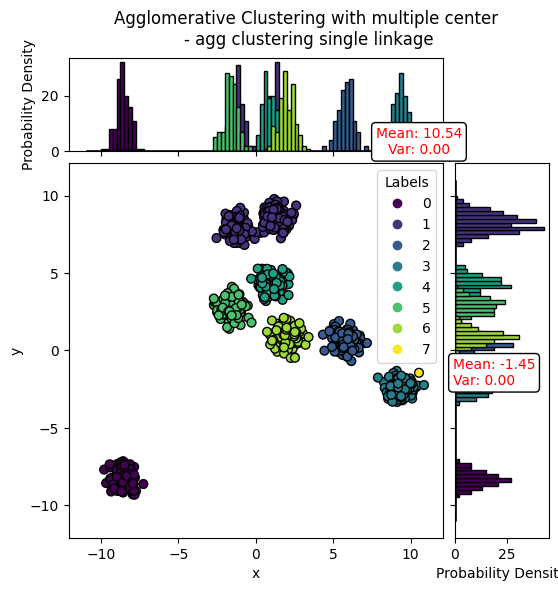

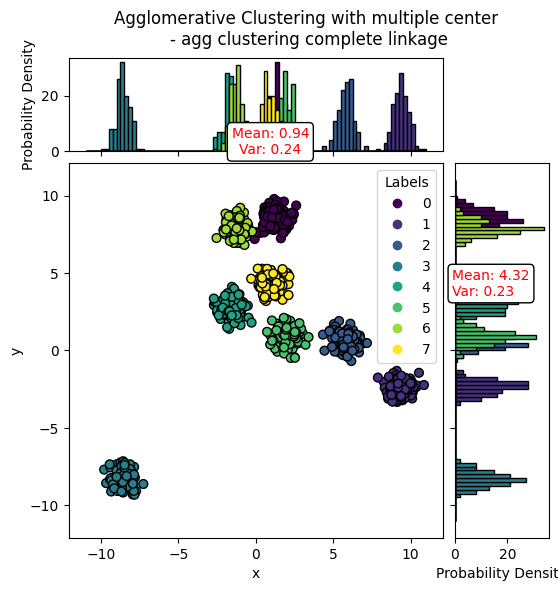

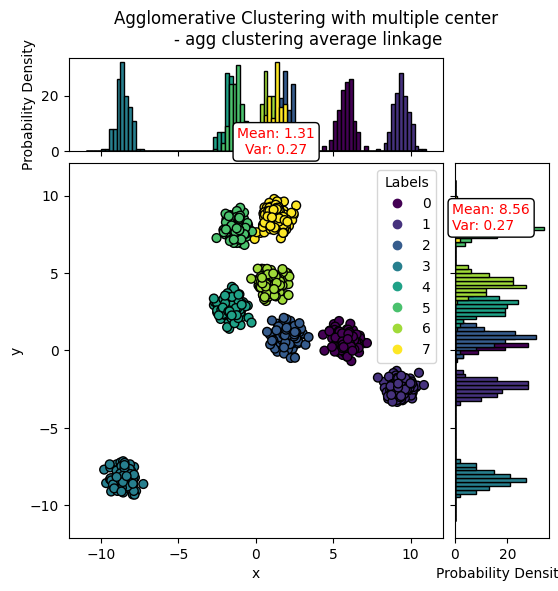

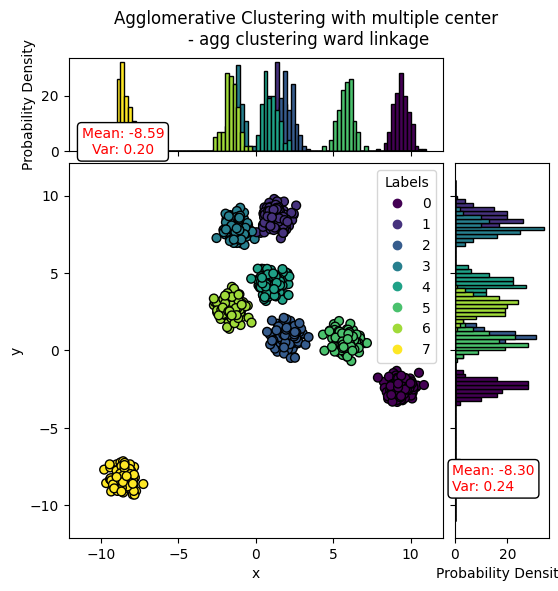

In [255]:
#pred4 = agg_optimal_clustering_case1(multiple_data, multiple_labels, k, "Agglomerative Clustering with multiple center \n- agg clustering")
compare_clustering(multiple_data,k,"Agglomerative Clustering with multiple center \n- agg clustering")

UFOC

K = 1 : V = 1.5532973944649417


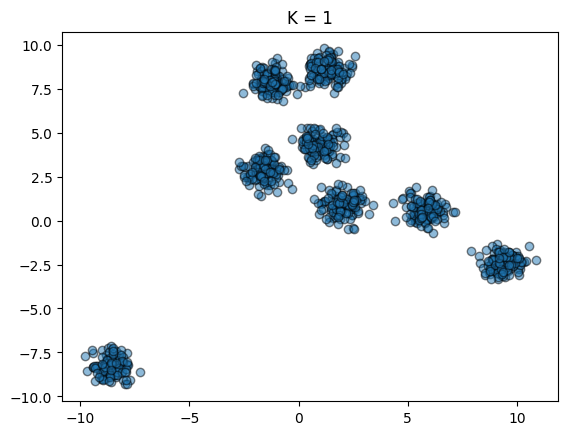

K = 2 : V = 0.842384108678423


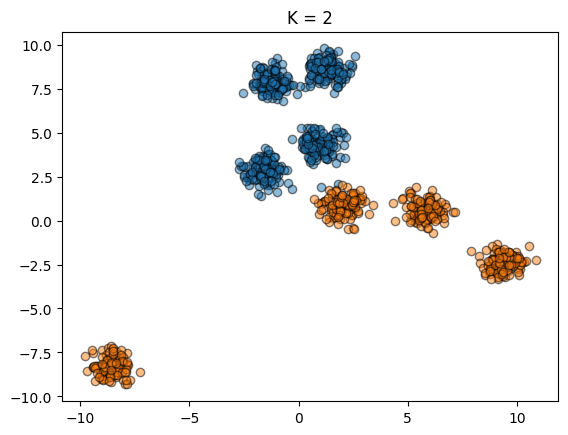

K = 3 : V = 8.288750591587572


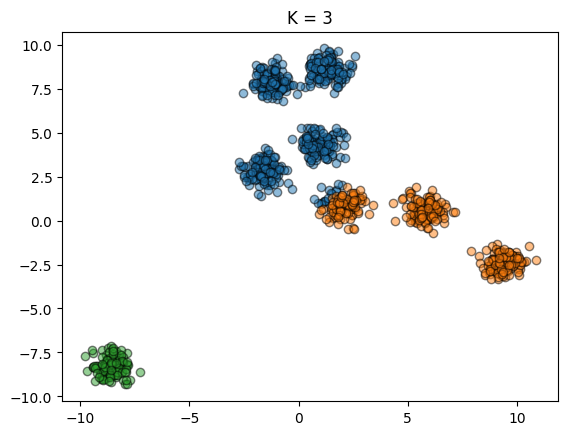

K = 4 : V = 11.808930668606974


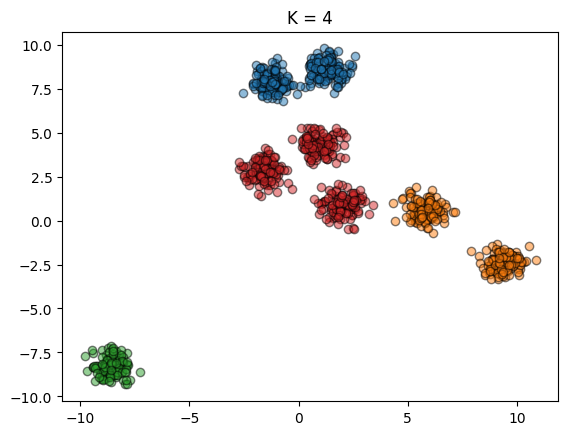

K = 5 : V = 17.609931584297367


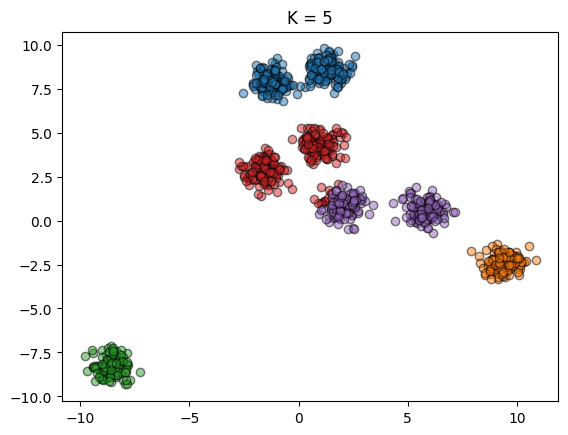

K = 6 : V = 26.959376505915124


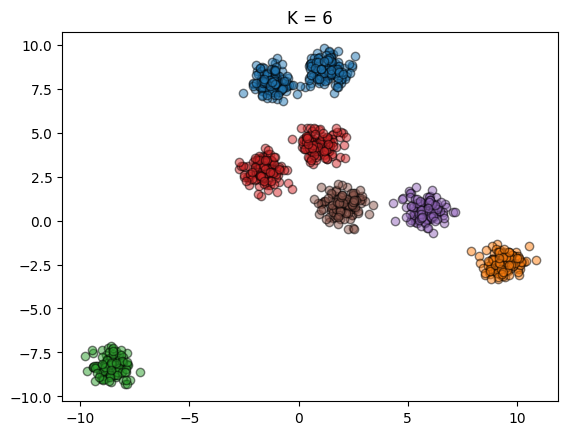

K = 7 : V = 30.388398090937898


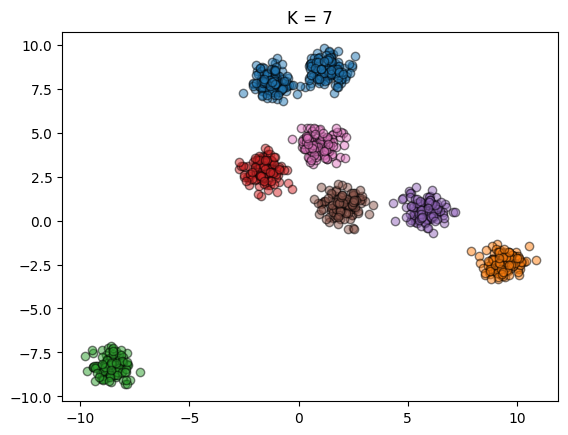

K = 8 : V = 25.55507871458864


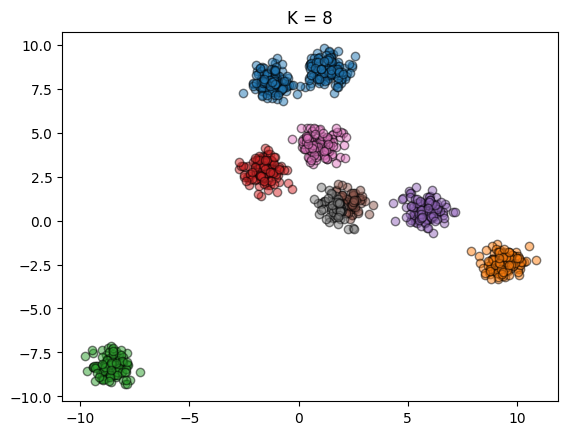

C:\Users\User\AppData\Local\Temp\ipykernel_12408\4014683696.py:33: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(c[0],c[1],marker='x',s=100,edgecolor='k')


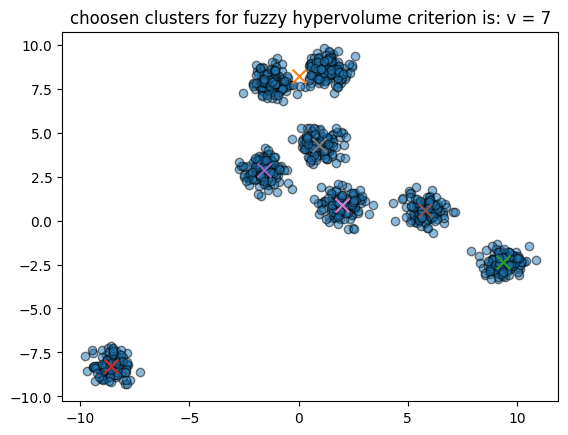

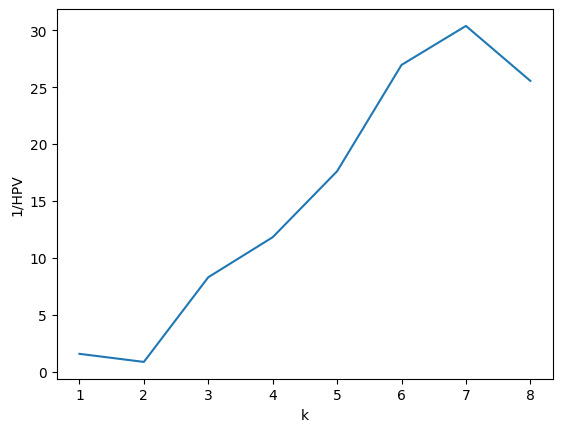

K = 1 : V = 1.5532973944649417
K = 2 : V = 0.842384108678423
K = 3 : V = 8.288750591587572
K = 4 : V = 11.808930668606974
K = 5 : V = 17.609931584297367
K = 6 : V = 26.959376505915124
K = 7 : V = 30.388398090937898
K = 8 : V = 25.55507871458864
K = 1 : V = 39.45134541897169


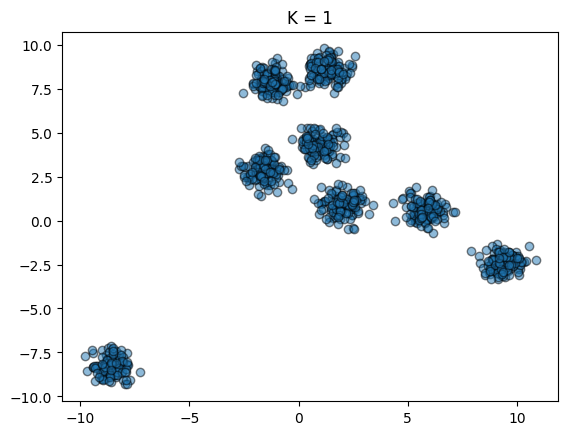

K = 2 : V = 49.86907710104547


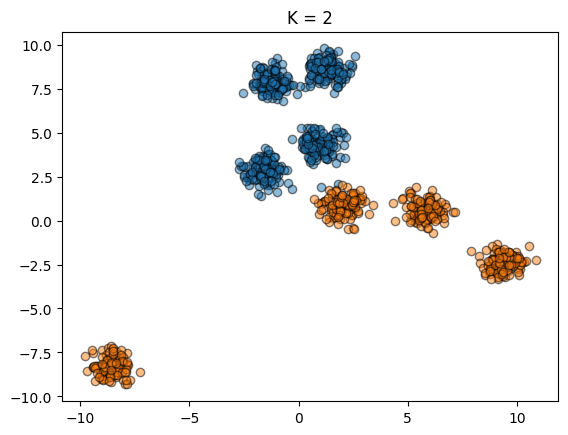

K = 3 : V = 163.79590054975083


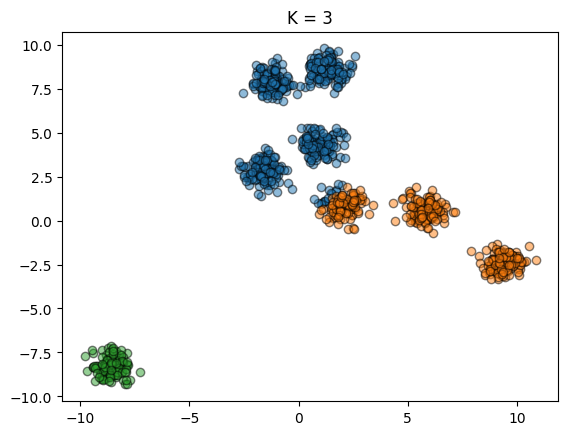

K = 4 : V = 232.11479721622956


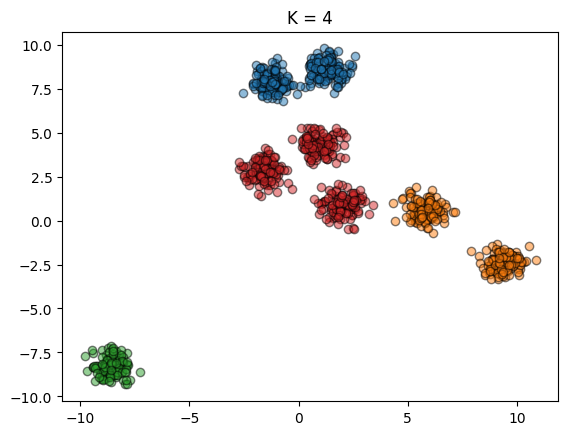

K = 5 : V = 314.97820142207644


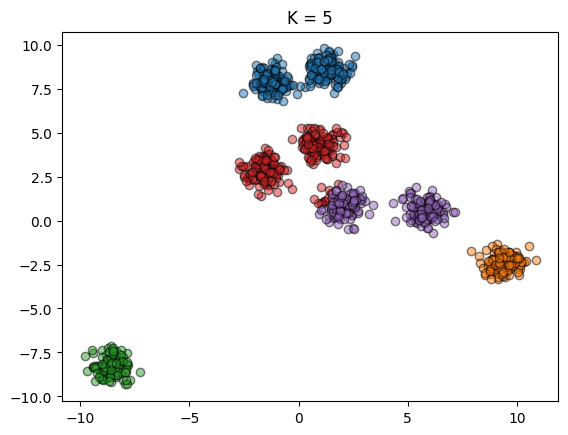

K = 6 : V = 415.3063072854202


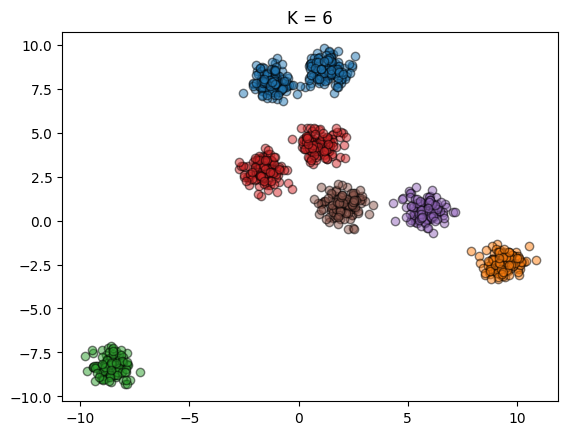

K = 7 : V = 472.9298522902168


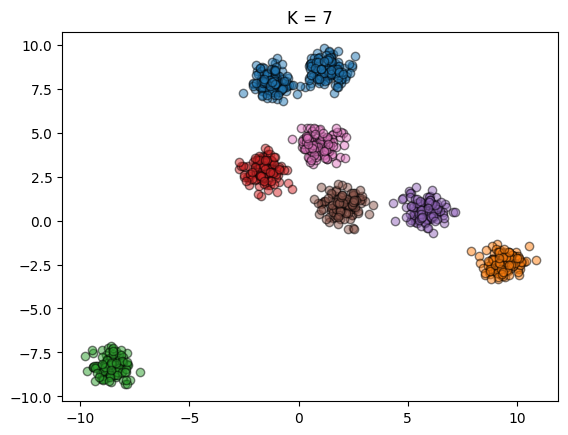

K = 8 : V = 424.98437977518535


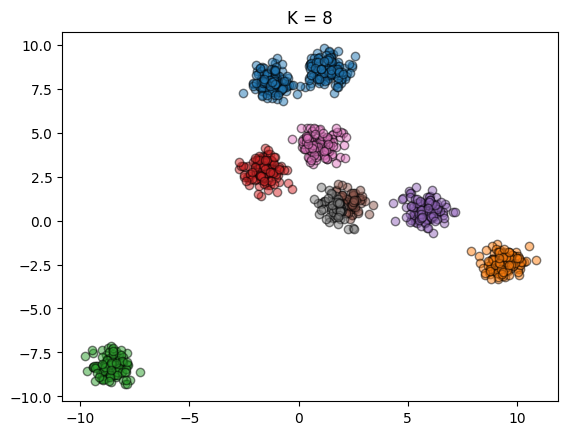

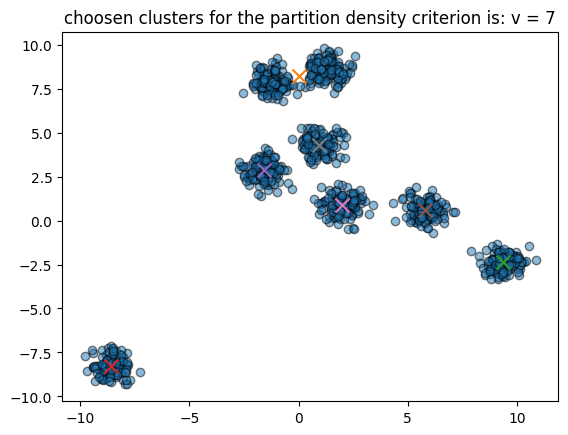

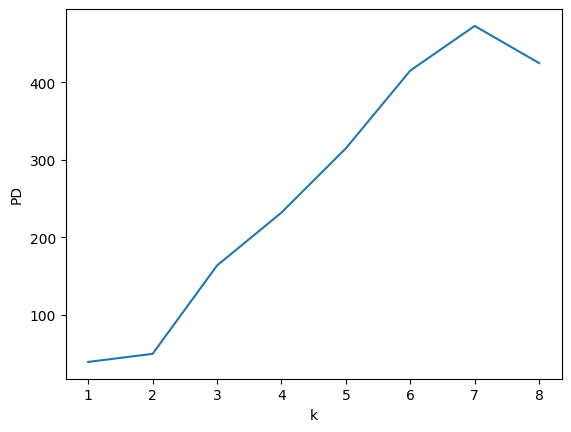

K = 1 : V = 39.45134541897169
K = 2 : V = 49.86907710104547
K = 3 : V = 163.79590054975083
K = 4 : V = 232.11479721622956
K = 5 : V = 314.97820142207644
K = 6 : V = 415.3063072854202
K = 7 : V = 472.9298522902168
K = 8 : V = 424.98437977518535
current K = 1
K = 1 : V = 39.45134541897169


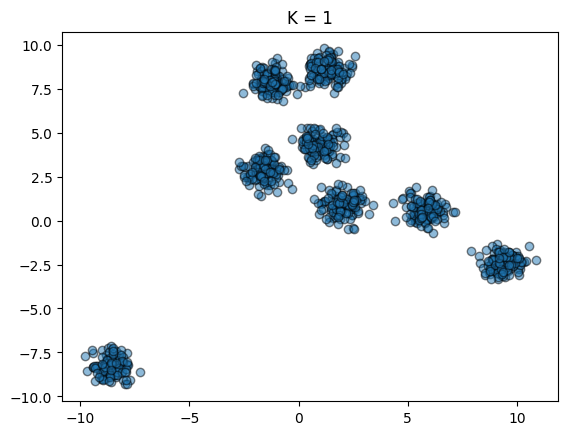

current K = 2
K = 2 : V = 186.08262372342372


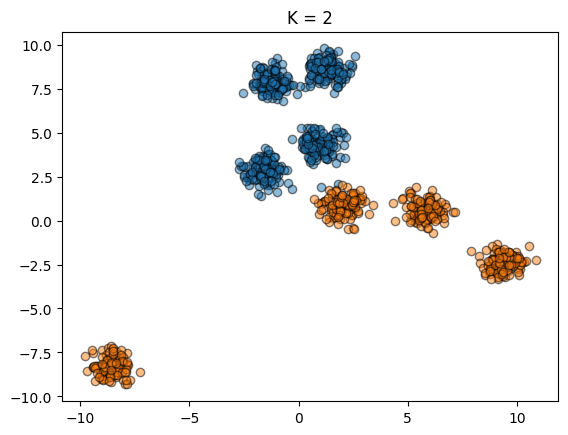

current K = 3
K = 3 : V = 1773.3106639199104


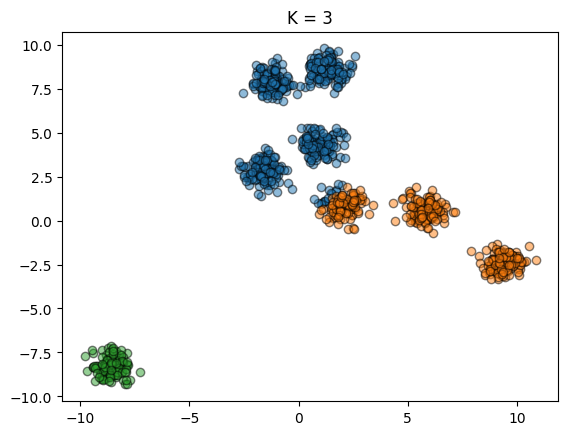

current K = 4
K = 4 : V = 1842.9134626011166


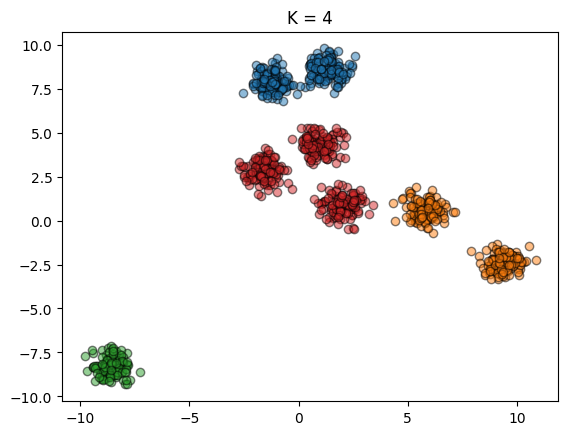

current K = 5
K = 5 : V = 2539.421428975896


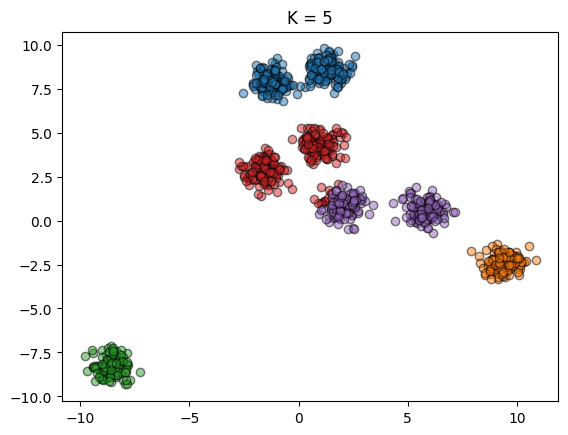

current K = 6
K = 6 : V = 3343.6725086542174


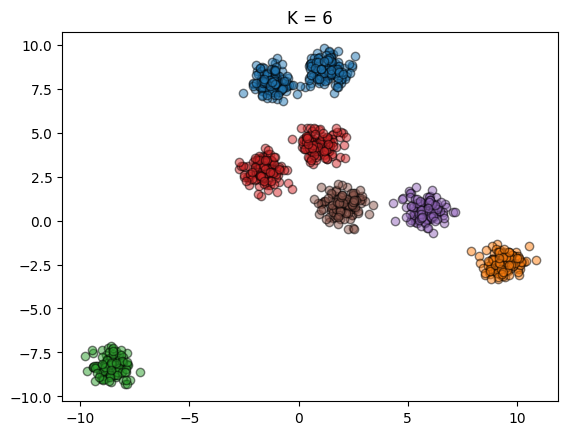

current K = 7
K = 7 : V = 3860.6468628602274


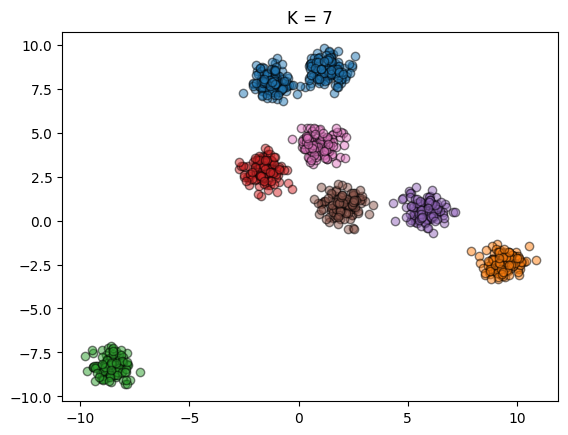

current K = 8
K = 8 : V = 3900.629468977603


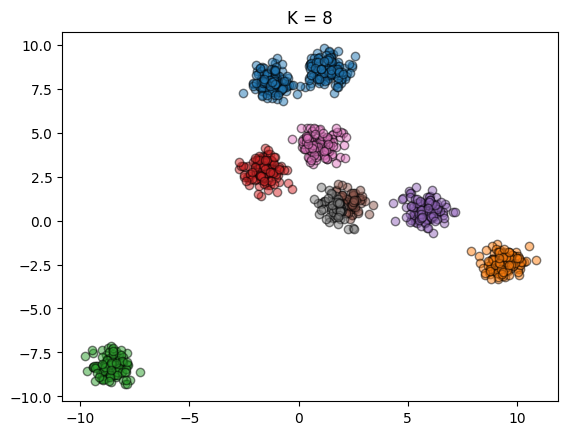

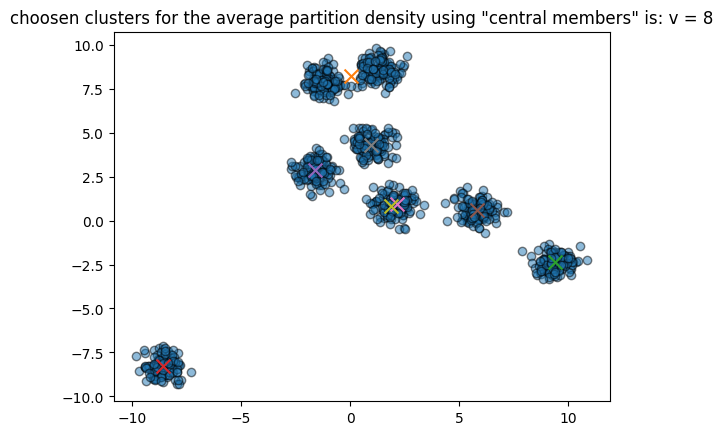

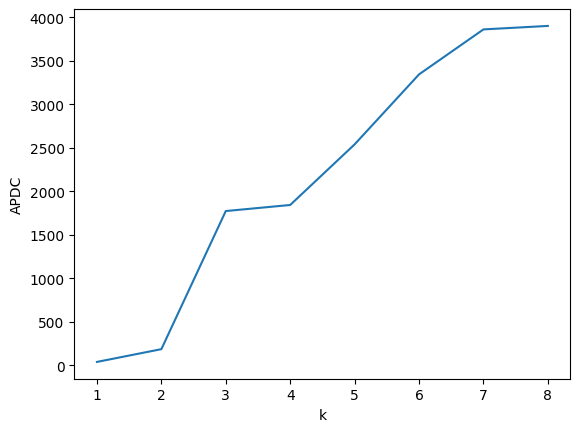

K = 1 : V = 39.45134541897169
K = 2 : V = 186.08262372342372
K = 3 : V = 1773.3106639199104
K = 4 : V = 1842.9134626011166
K = 5 : V = 2539.421428975896
K = 6 : V = 3343.6725086542174
K = 7 : V = 3860.6468628602274
K = 8 : V = 3900.629468977603
current K = 1
K = 1 : V = 39.45134541897169


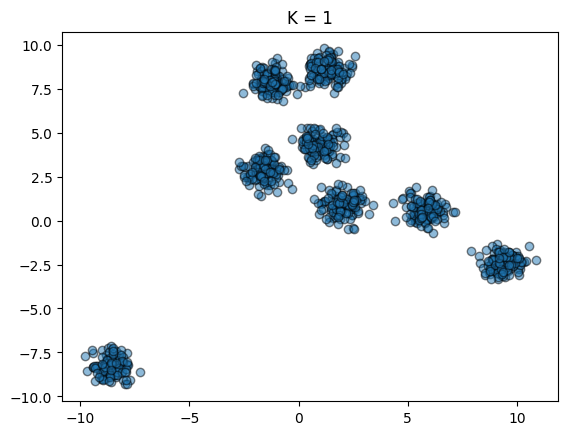

current K = 2
K = 2 : V = 78.5226152430387


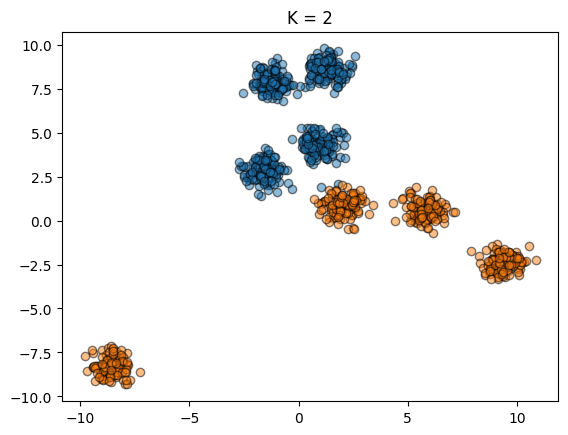

current K = 3
K = 3 : V = 192.75364176952056


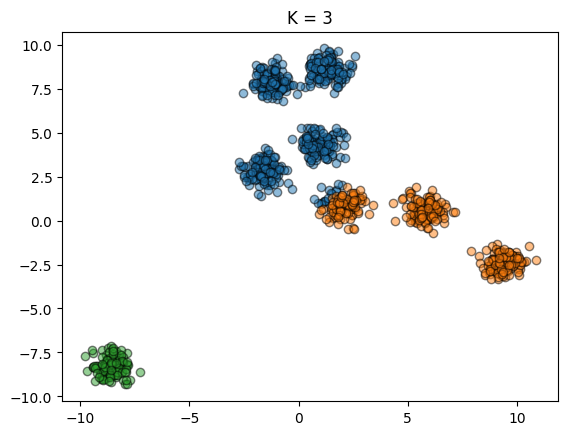

current K = 4
K = 4 : V = 144.56523132714042


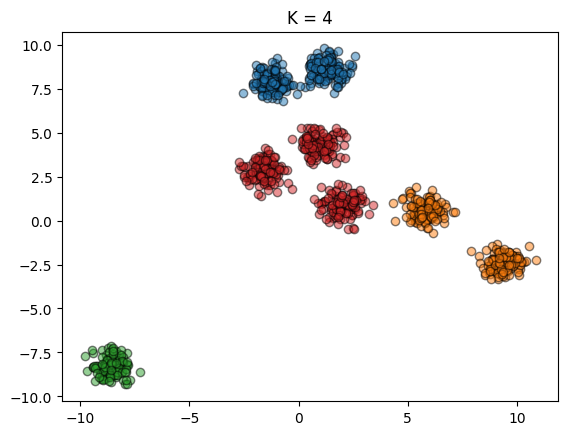

current K = 5
K = 5 : V = 116.78703666514316


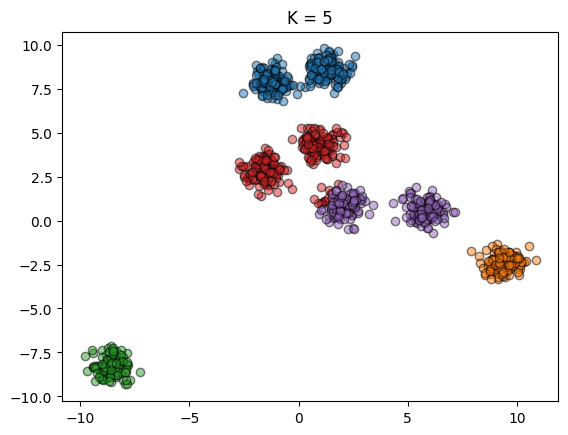

current K = 6
K = 6 : V = 97.38822418053053


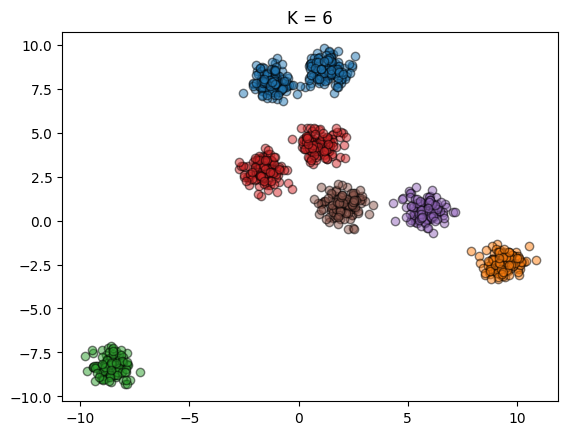

current K = 7
K = 7 : V = 83.47562072616866


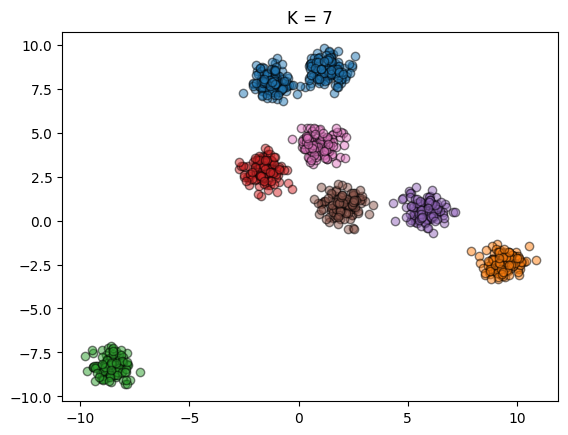

current K = 8
K = 8 : V = 73.04116813680294


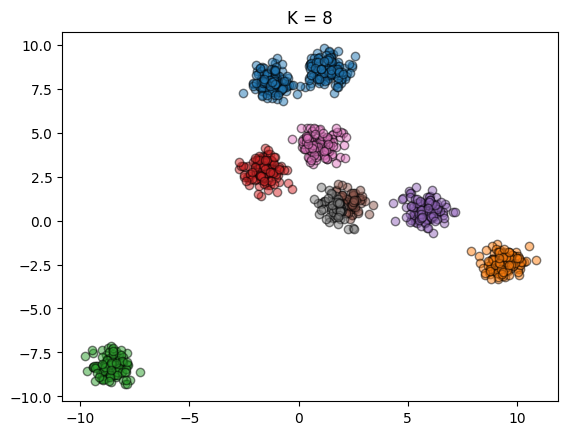

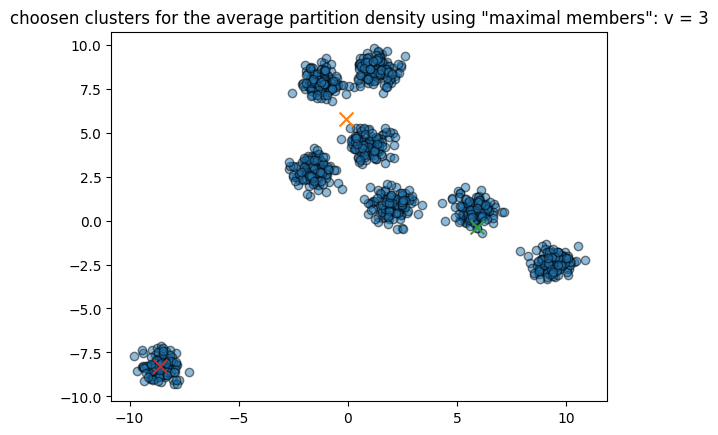

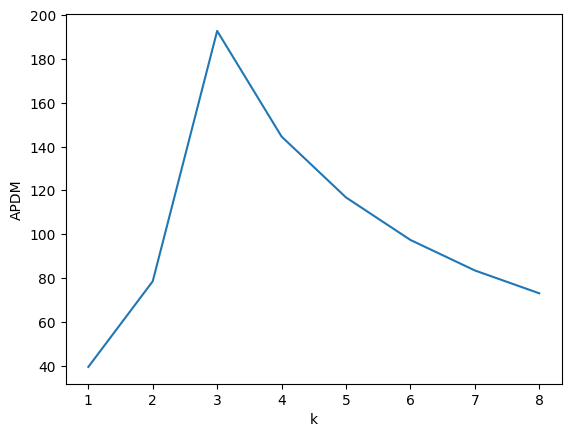

K = 1 : V = 39.45134541897169
K = 2 : V = 78.5226152430387
K = 3 : V = 192.75364176952056
K = 4 : V = 144.56523132714042
K = 5 : V = 116.78703666514316
K = 6 : V = 97.38822418053053
K = 7 : V = 83.47562072616866
K = 8 : V = 73.04116813680294
K = 1 : V = 2.7490327094314875e-201


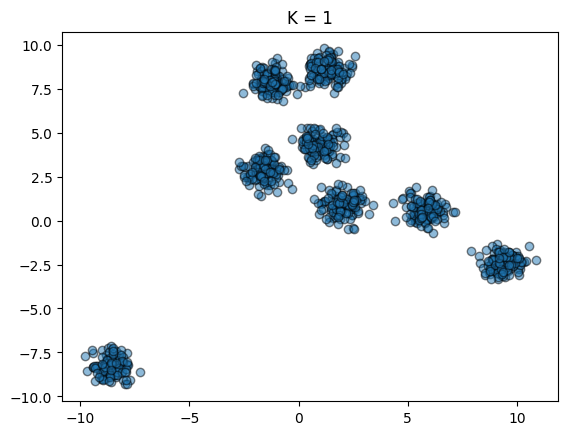

K = 2 : V = 9.16948736628509e-234


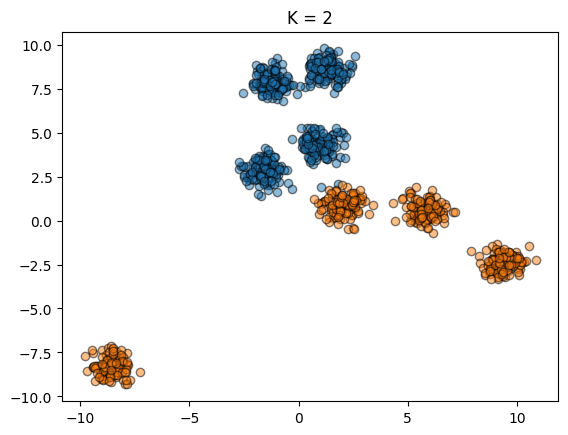

C:\Users\User\AppData\Local\Temp\ipykernel_12408\3236583970.py:8: RuntimeWarning: invalid value encountered in multiply
  NPIR += np.sum(np.sum((membership[:, i] ** b) * np.dot(diff, diff.T)))


K = 3 : V = nan


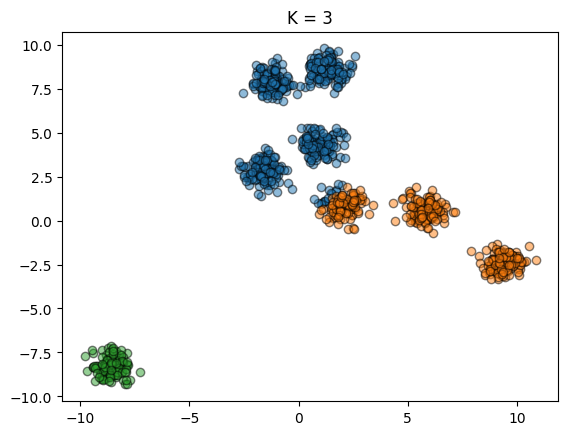

K = 4 : V = nan


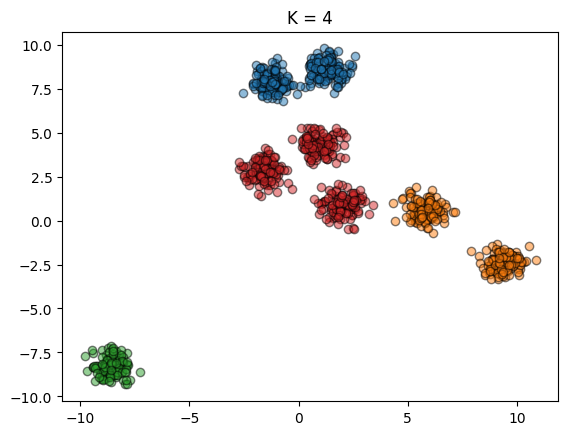

K = 5 : V = nan


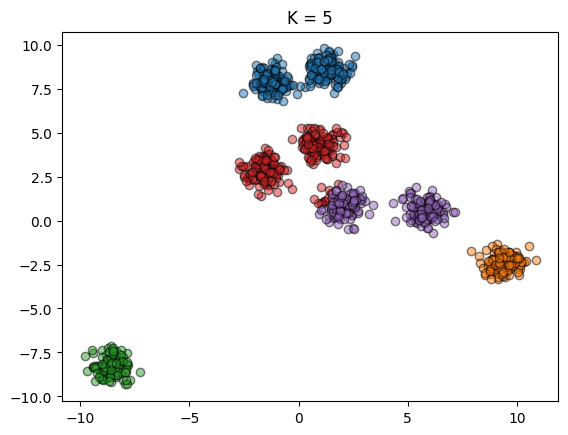

K = 6 : V = nan


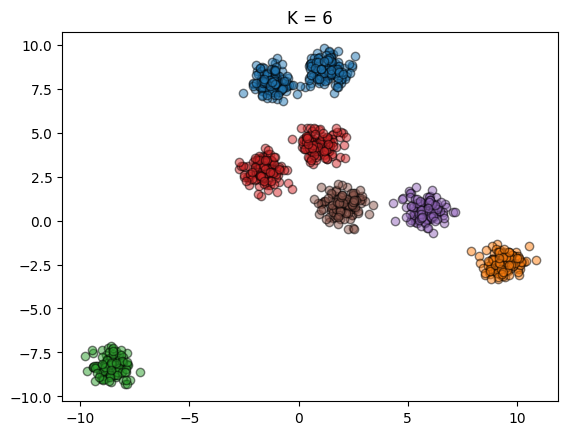

K = 7 : V = nan


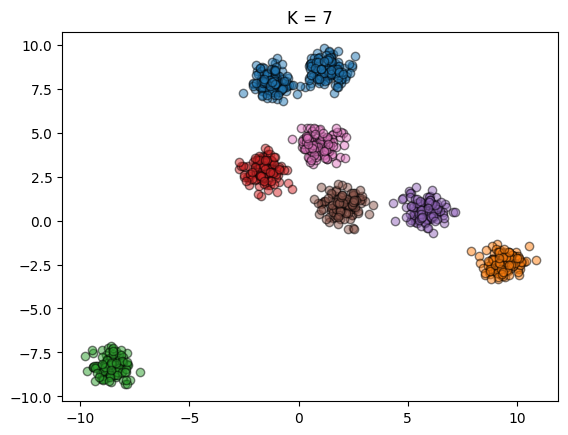

K = 8 : V = nan


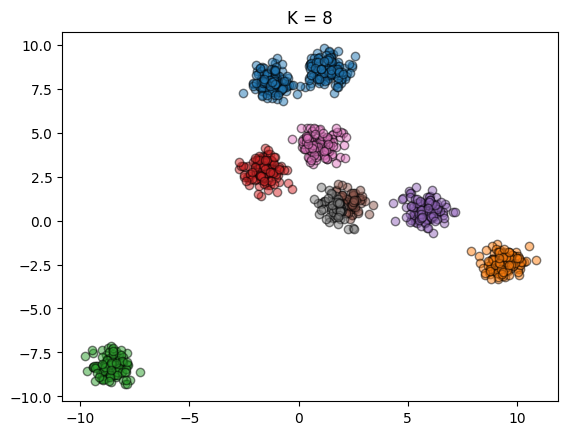

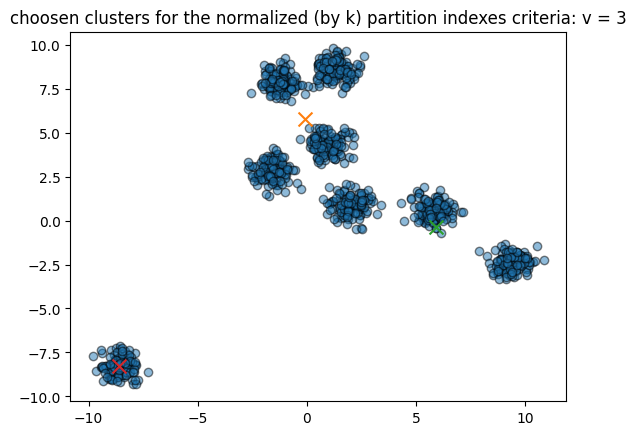

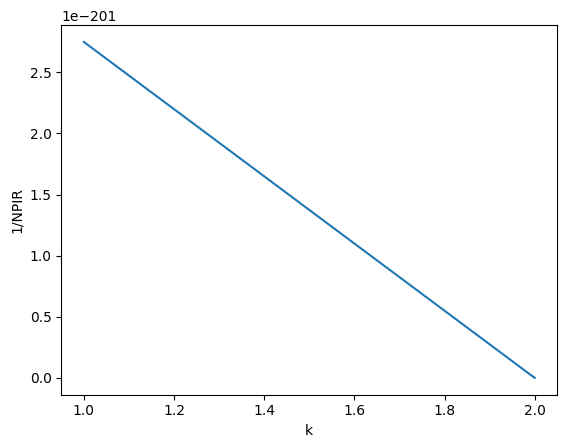

K = 1 : V = 2.7490327094314875e-201
K = 2 : V = 9.16948736628509e-234
K = 3 : V = nan
K = 4 : V = nan
K = 5 : V = nan
K = 6 : V = nan
K = 7 : V = nan
K = 8 : V = nan
K = 1 : V = inf


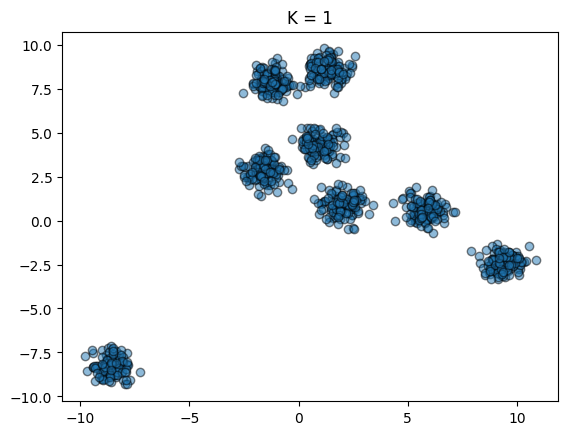

K = 2 : V = 7.299878327980921


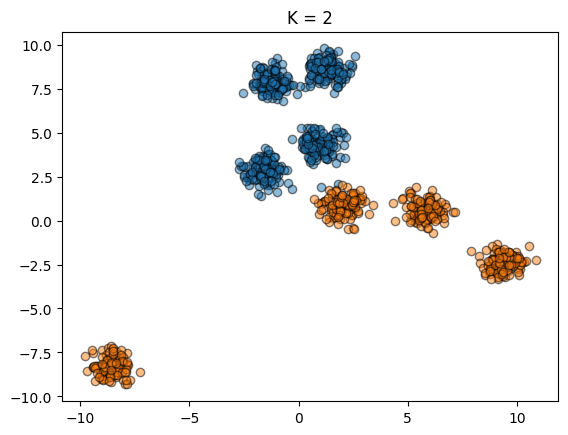

K = 3 : V = 40.40488555133905


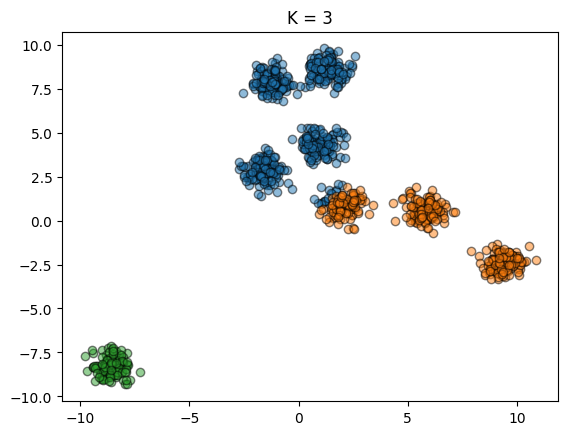

K = 4 : V = 89.27314197027891


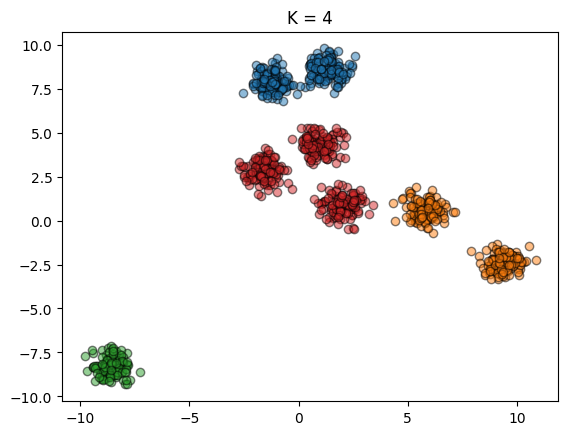

K = 5 : V = 121.96300304279988


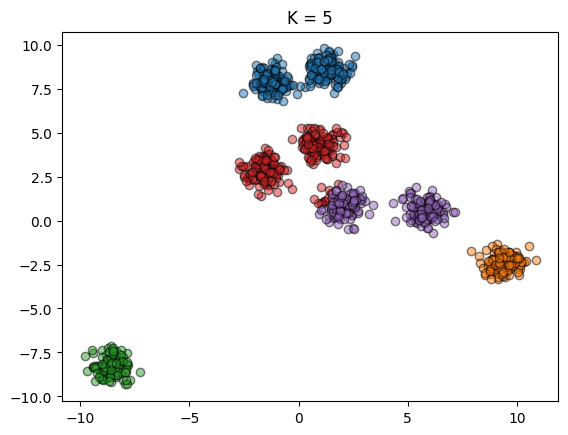

K = 6 : V = 149.5626331297562


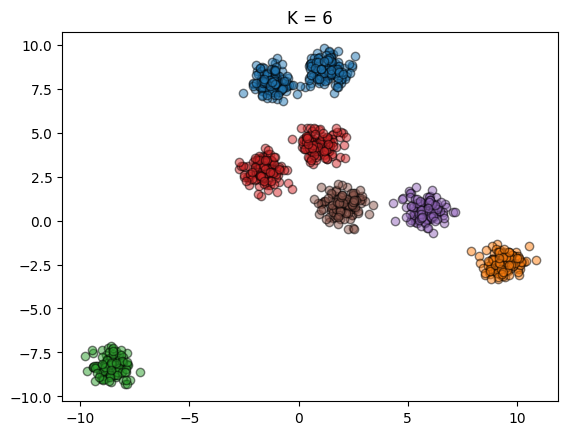

K = 7 : V = 171.98441767551662


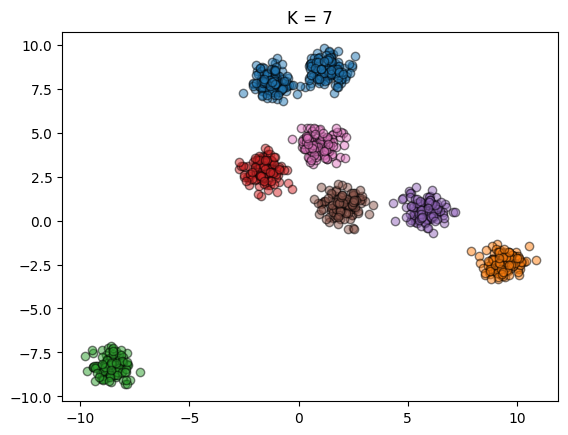

K = 8 : V = 159.01083913877113


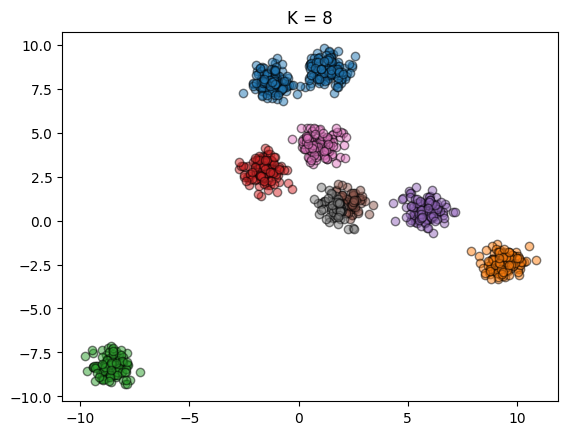

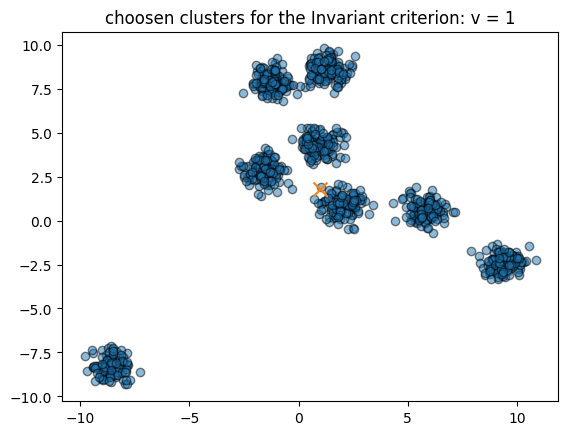

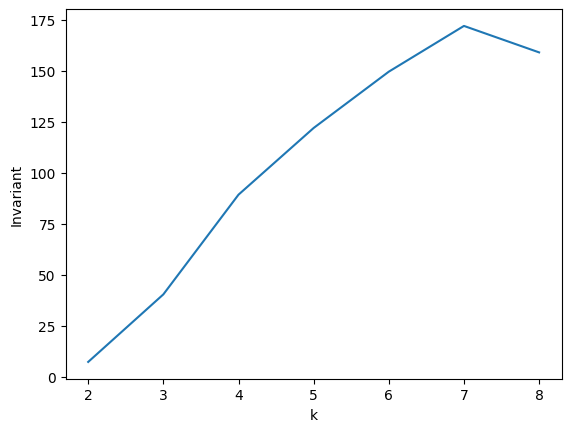

K = 1 : V = inf
K = 2 : V = 7.299878327980921
K = 3 : V = 40.40488555133905
K = 4 : V = 89.27314197027891
K = 5 : V = 121.96300304279988
K = 6 : V = 149.5626331297562
K = 7 : V = 171.98441767551662
K = 8 : V = 159.01083913877113


In [284]:
comper_criteria_WUOFC(multiple_data, 9,[1,2,3,4,5,6,7,8])

<h2>2D data shaped like circles

mle estimation with random initialization

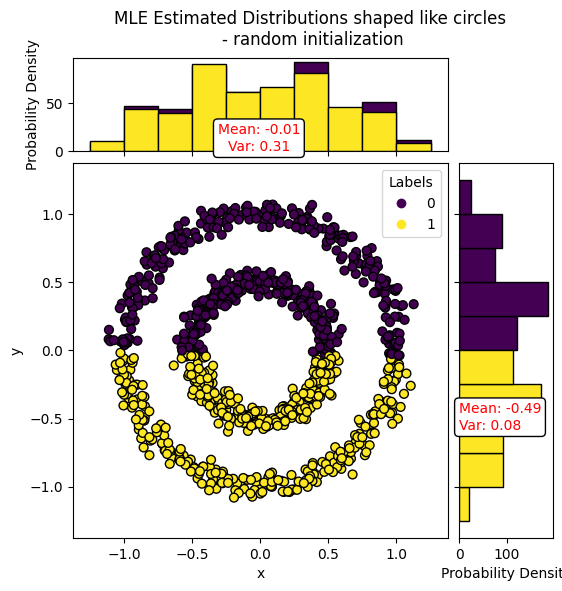

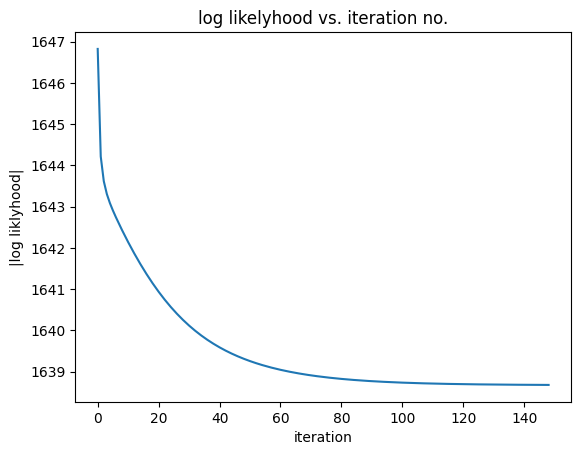

In [ ]:
k=2
d=2
circles_data, circles_labels = make_circles(n_samples=1000, factor=0.5, noise=0.05, random_state=0)
init1 = initial_model(circles_data,k, d, 'rand', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(circles_data,circles_labels, init1,'MLE Estimated Distributions shaped like circles \n- random initialization', case=1)
plot_log_likelihood(lol1)

mle estimation with KNN initialization

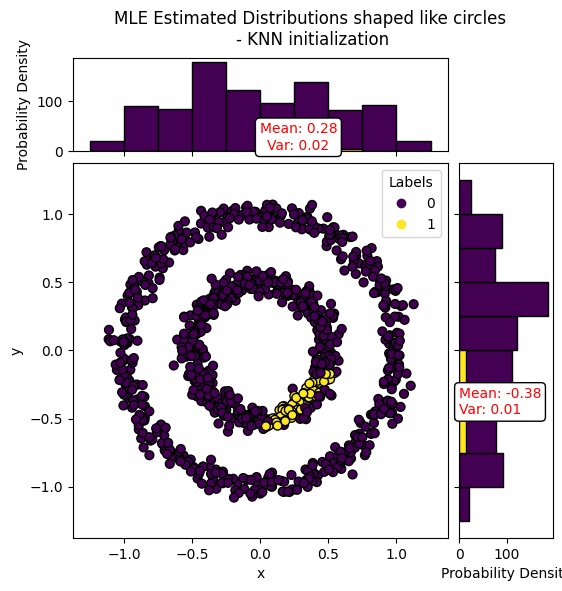

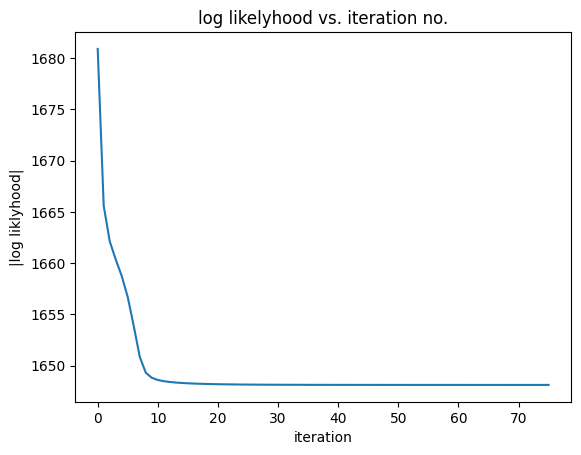

In [259]:
init1 = initial_model(circles_data,k, d, 'knn', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(circles_data,circles_labels, init1,'MLE Estimated Distributions shaped like circles \n- KNN initialization', case=1)
plot_log_likelihood(lol1)

agg clustering

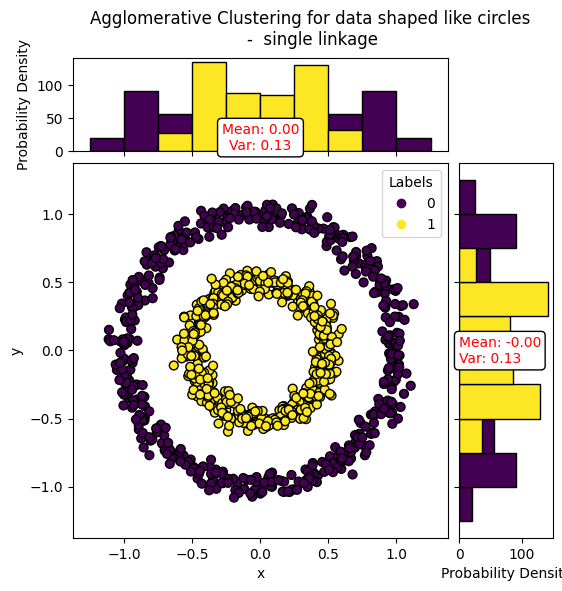

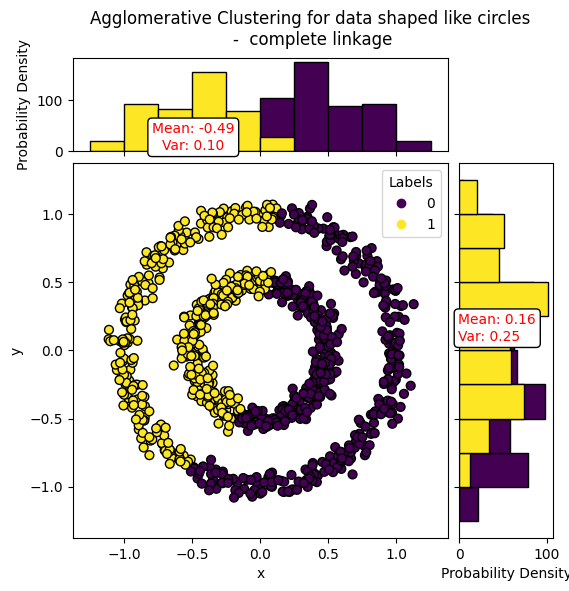

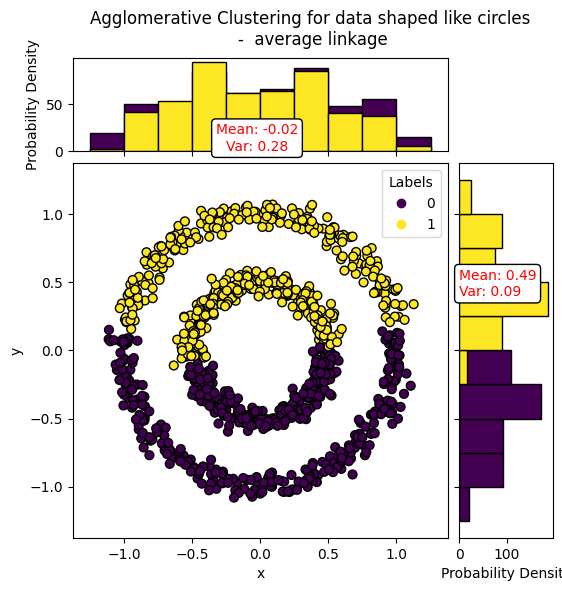

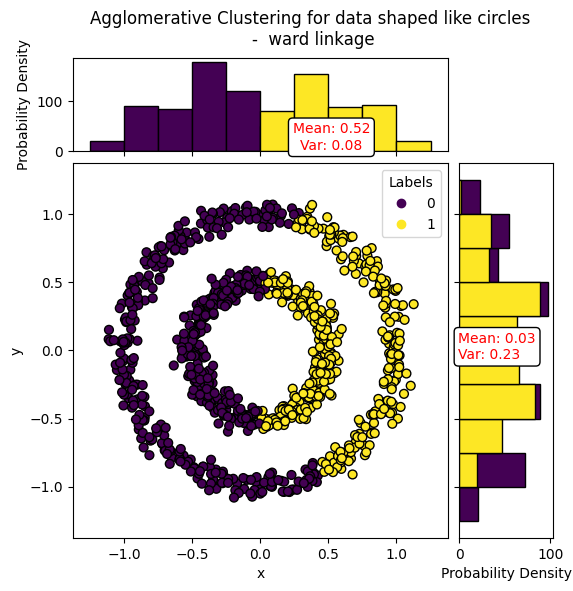

In [260]:
#pred4 = agg_optimal_clustering_case1(circles_data, circles_labels, k, "Agglomerative Clustering for data shaped like circles \n- agg clustering")
compare_clustering(circles_data,k,"Agglomerative Clustering for data shaped like circles \n- ")

UFOC

K = 1 : V = 10063.851374645856


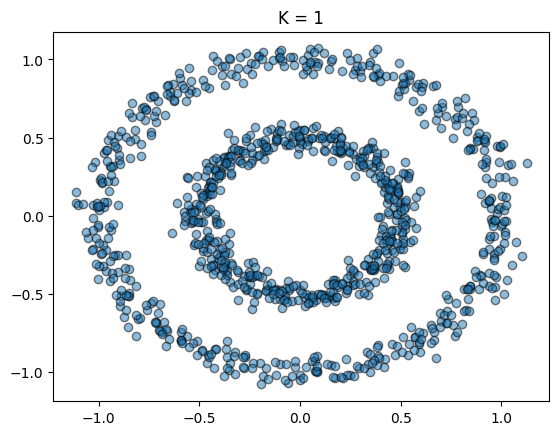

c:\Users\User\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\lib\function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
c:\Users\User\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\core\_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
C:\Users\User\AppData\Local\Temp\ipykernel_12408\84658773.py:10: RuntimeWarning: Degrees of freedom <= 0 for slice
  S_i = np.cov(c.T)
c:\Users\User\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
c:\Users\User\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\lib\function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
c:\Users\User\PycharmProjects\pythonProject1\venv\lib\site-packages\numpy\linalg\linalg.py:2180: RuntimeWarning: invalid value encountered in det
  r

ZeroDivisionError: division by zero

In [286]:
comper_criteria_WUOFC(circles_data, 6,[1,2,3,4,5])

<h2> 2D data shaped like moon

MLE estemation with random initialization

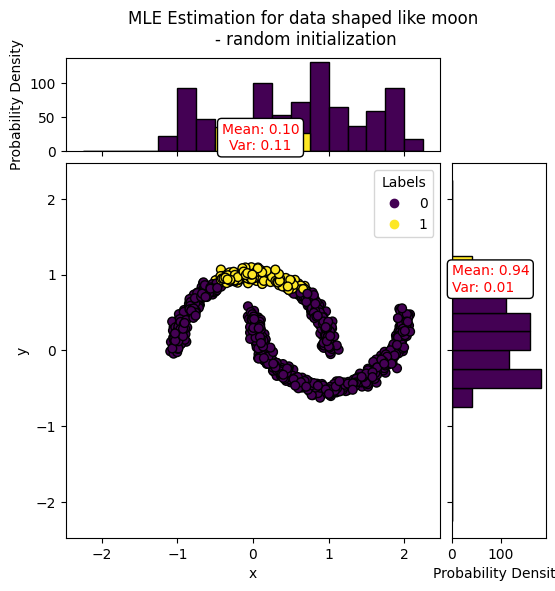

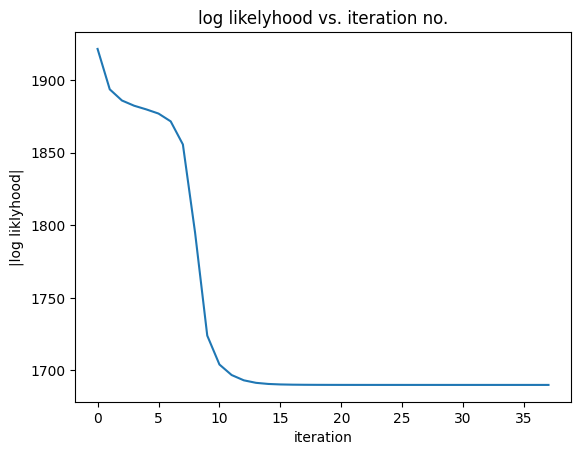

In [287]:
k=2
d=2
moon_data, moon_labels = make_moons(n_samples=1000, noise=0.05)
init1 = initial_model(moon_data,k, d, 'rand', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(moon_data,moon_labels, init1,'MLE Estimation for data shaped like moon \n- random initialization', case=1)
plot_log_likelihood(lol1)

MLE estimation with KNN initialization

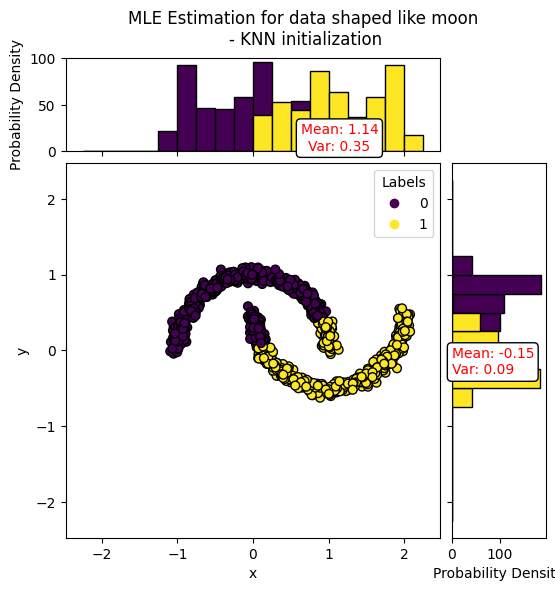

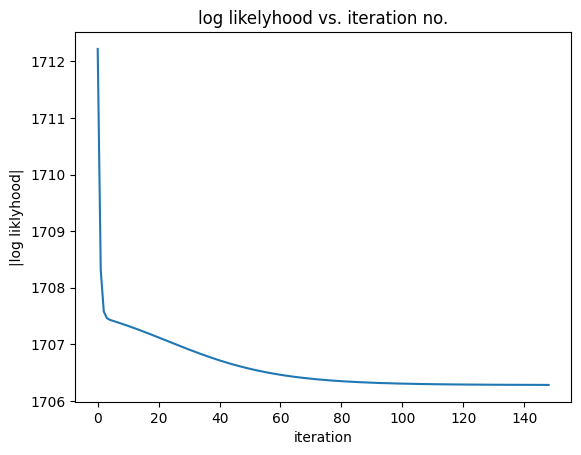

In [288]:
init1 = initial_model(moon_data,k, d, 'knn', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(moon_data,multiple_labels, init1,'MLE Estimation for data shaped like moon \n- KNN initialization', case=1)
plot_log_likelihood(lol1)


agg clastering

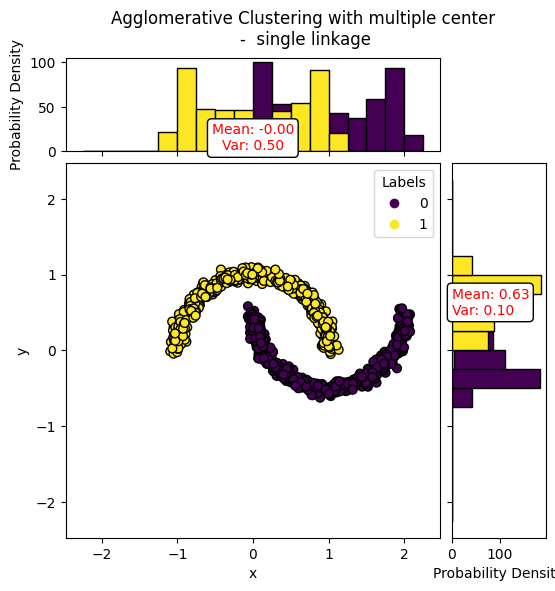

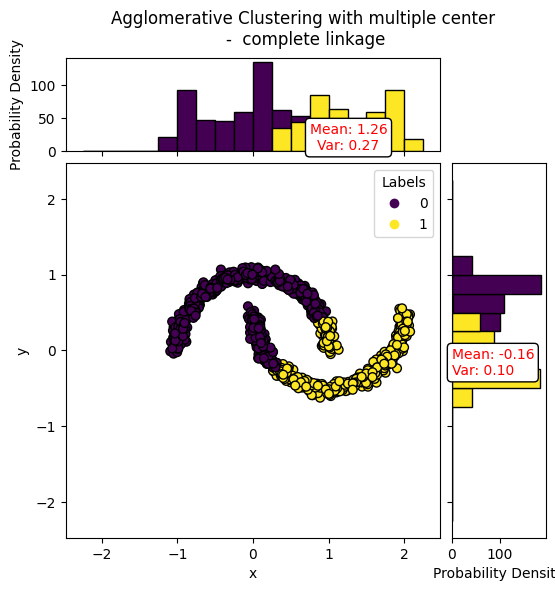

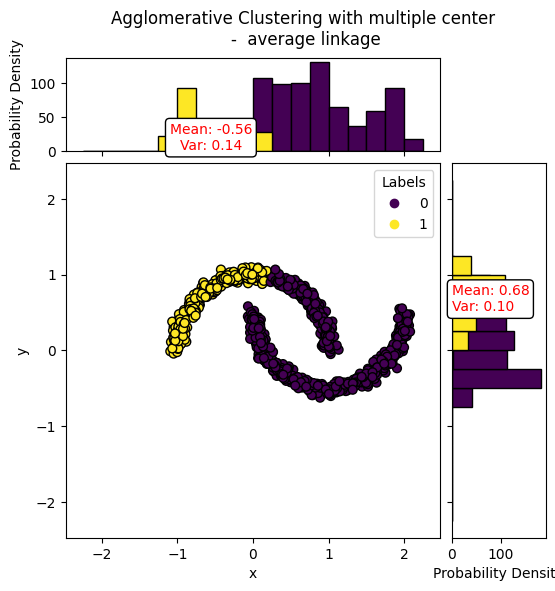

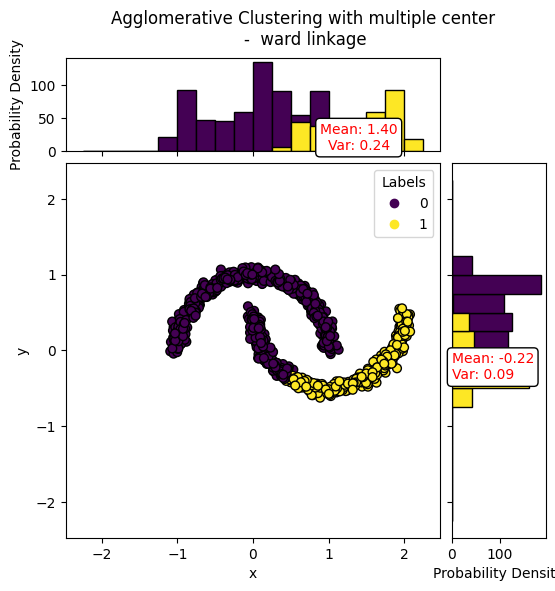

In [289]:
#pred4= agg_optimal_clustering_case1(moon_data, moon_labels, k, "Agglomerative Clustering with multiple center \n- agg clustering")
compare_clustering(moon_data,k,"Agglomerative Clustering with multiple center \n- ")

UFOC

K = 1 : V = 6716.466749325293


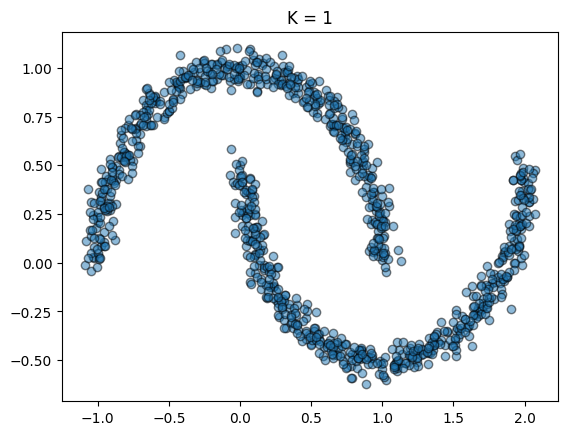

K = 2 : V = 3523.053876351242


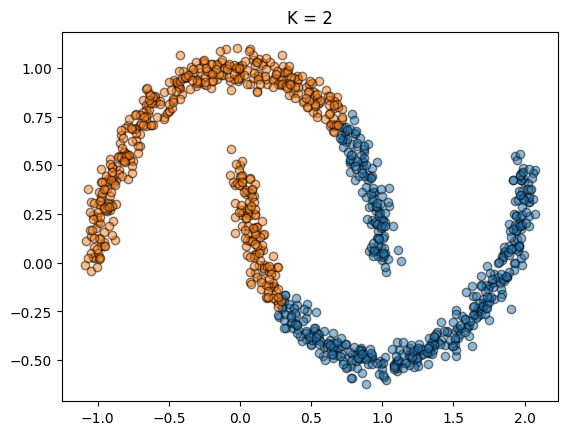

K = 3 : V = 3359.6985863551836


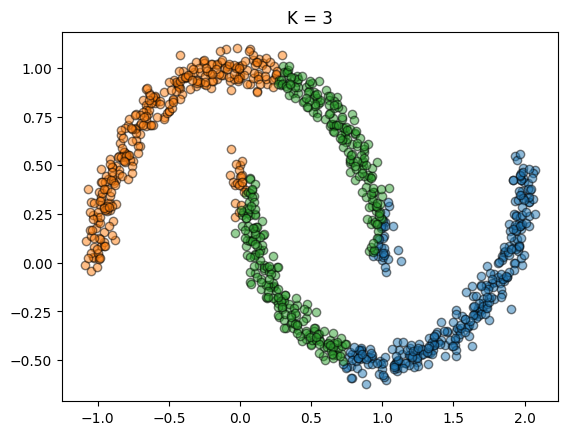

K = 4 : V = 3270.7396869487743


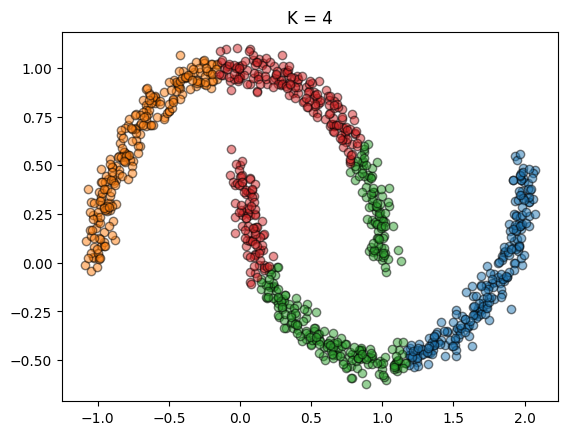

K = 5 : V = 2576.945121795629


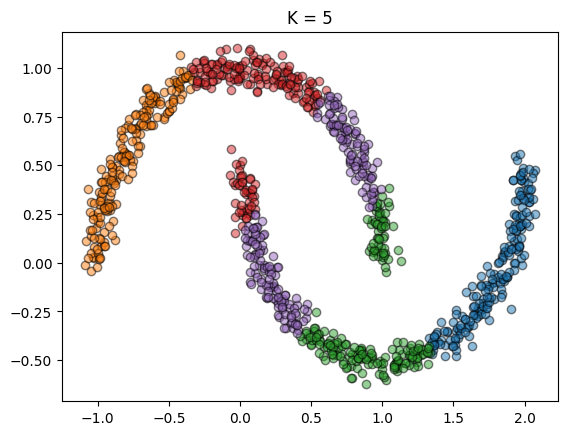

C:\Users\User\AppData\Local\Temp\ipykernel_12408\4014683696.py:33: UserWarning: You passed a edgecolor/edgecolors ('k') for an unfilled marker ('x').  Matplotlib is ignoring the edgecolor in favor of the facecolor.  This behavior may change in the future.
  plt.scatter(c[0],c[1],marker='x',s=100,edgecolor='k')


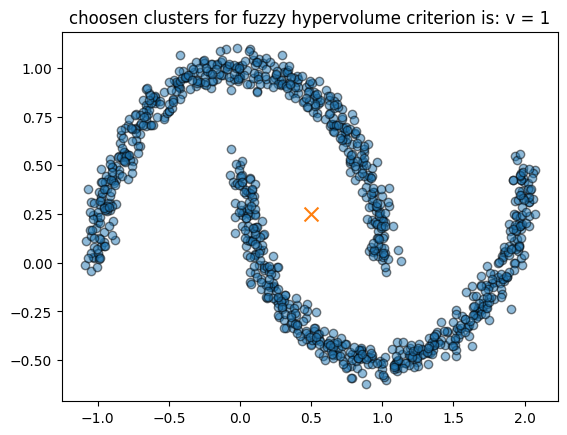

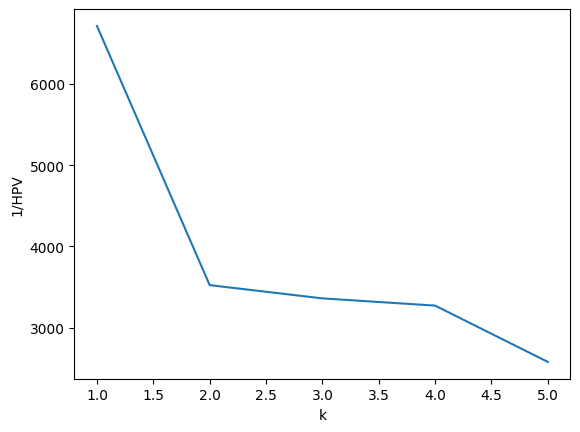

K = 1 : V = 6716.466749325293
K = 2 : V = 3523.053876351242
K = 3 : V = 3359.6985863551836
K = 4 : V = 3270.7396869487743
K = 5 : V = 2576.945121795629
K = 1 : V = 2594.20890814978


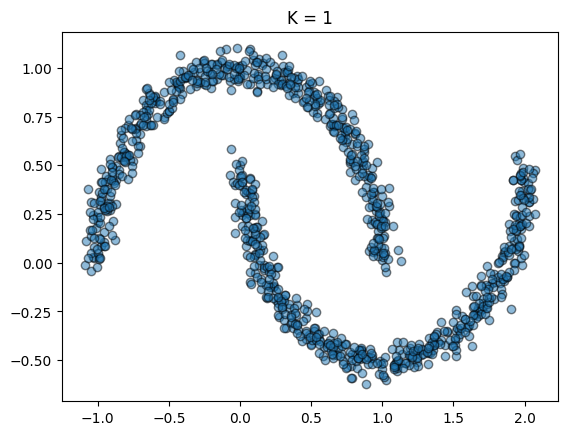

K = 2 : V = 1297.1044540928185


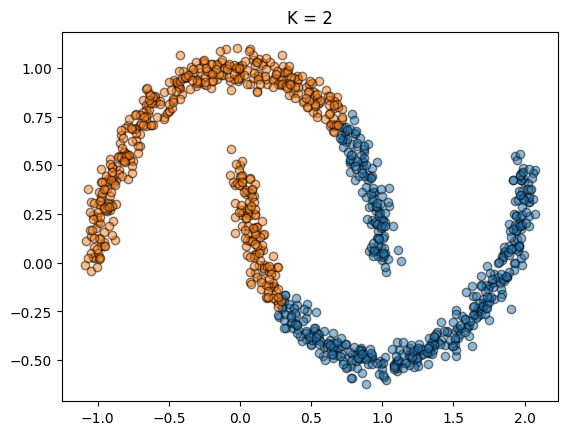

K = 3 : V = 1821.0061868643


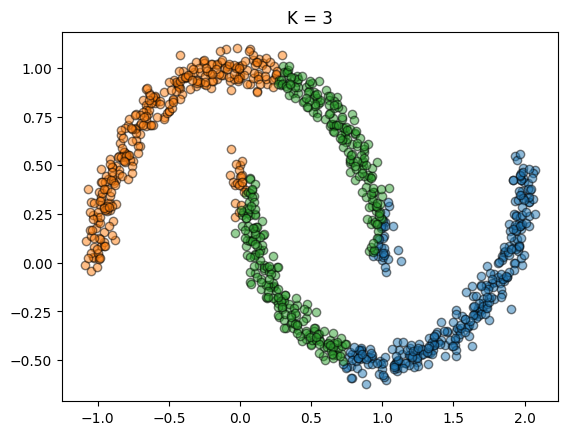

K = 4 : V = 1429.6671603591128


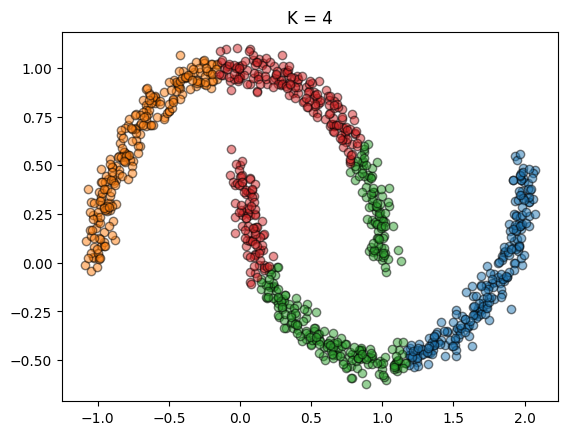

K = 5 : V = 1140.144462487402


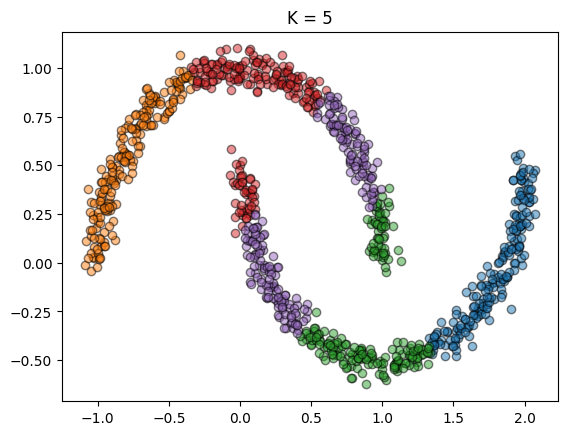

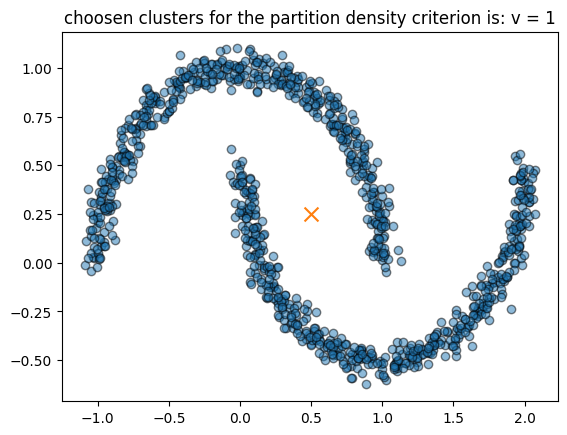

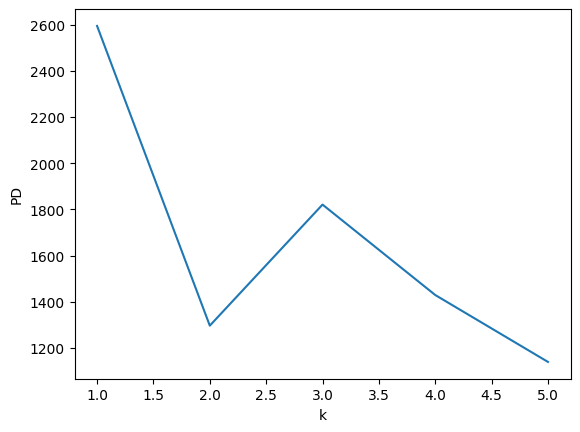

K = 1 : V = 2594.20890814978
K = 2 : V = 1297.1044540928185
K = 3 : V = 1821.0061868643
K = 4 : V = 1429.6671603591128
K = 5 : V = 1140.144462487402
current K = 1
K = 1 : V = 2594.20890814978


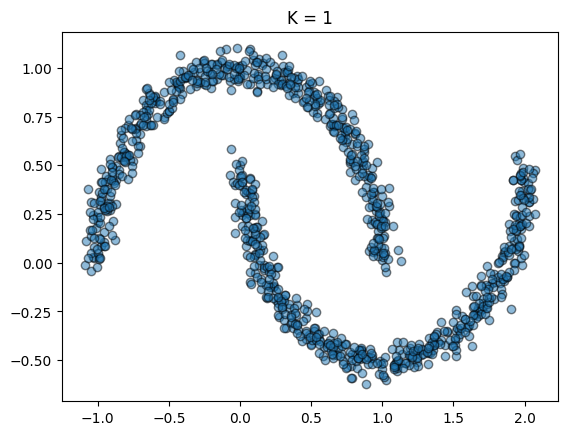

current K = 2
K = 2 : V = 2594.208908185637


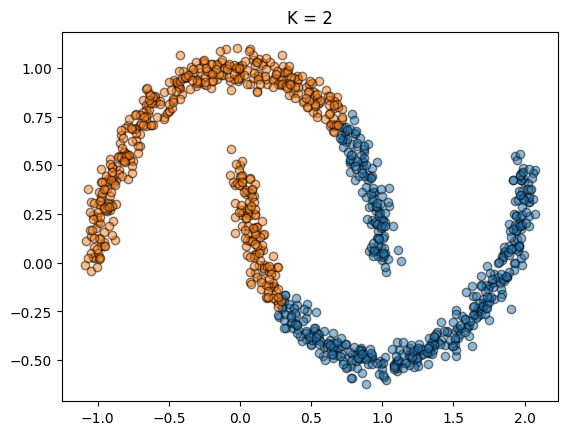

current K = 3
K = 3 : V = 5528.567619627375


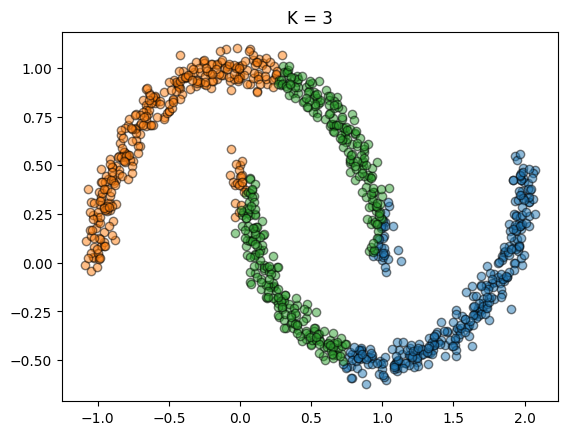

current K = 4
K = 4 : V = 5789.516464757082


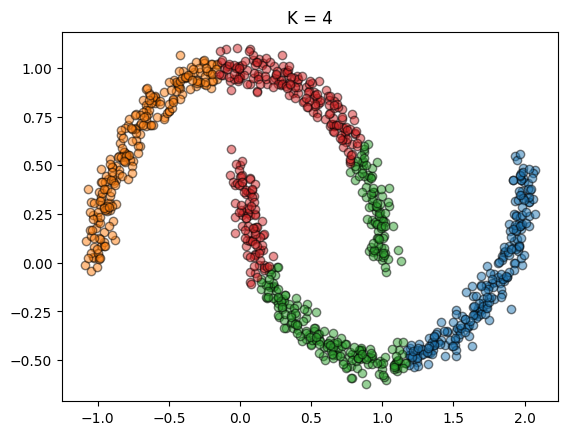

current K = 5
K = 5 : V = 5839.117367780613


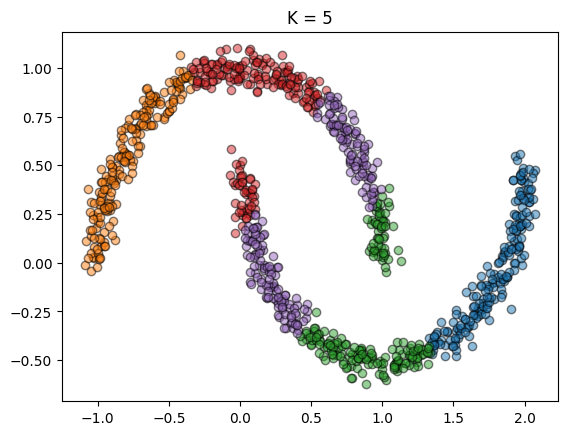

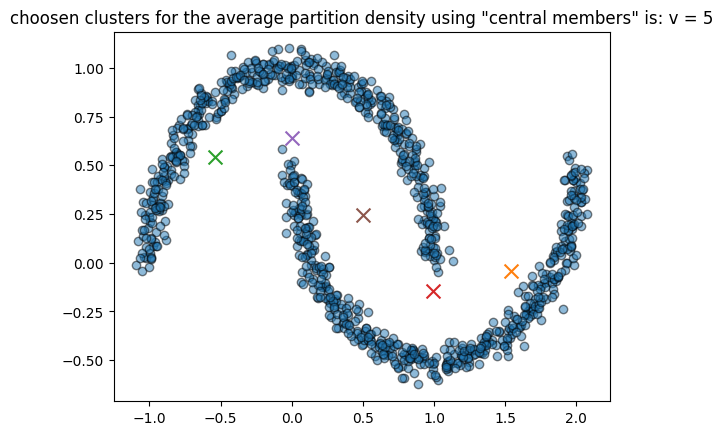

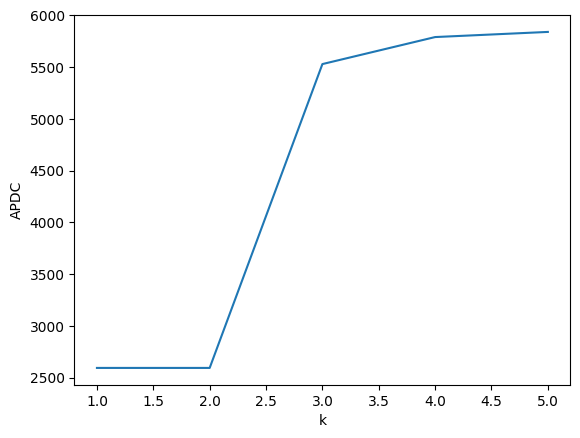

K = 1 : V = 2594.20890814978
K = 2 : V = 2594.208908185637
K = 3 : V = 5528.567619627375
K = 4 : V = 5789.516464757082
K = 5 : V = 5839.117367780613
current K = 1
K = 1 : V = 2594.20890814978


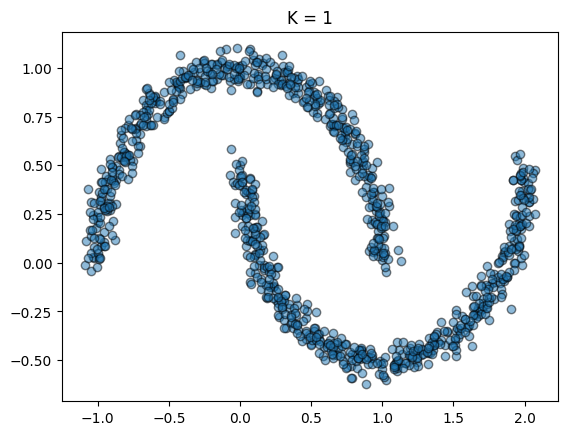

current K = 2
K = 2 : V = 649.8493314426694


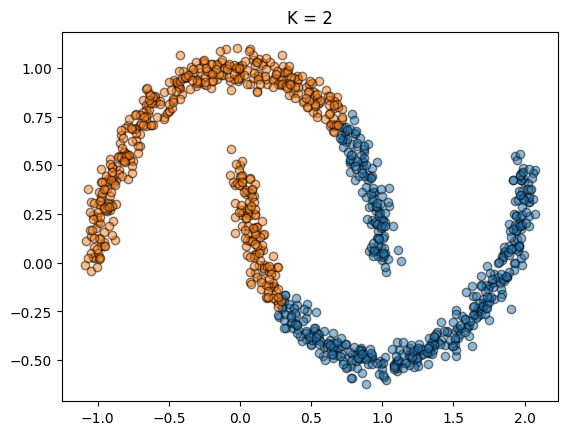

current K = 3
K = 3 : V = 639.6986156749531


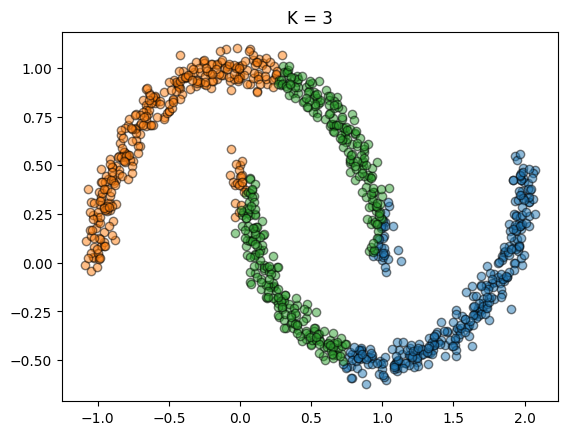

current K = 4
K = 4 : V = 362.70676915874304


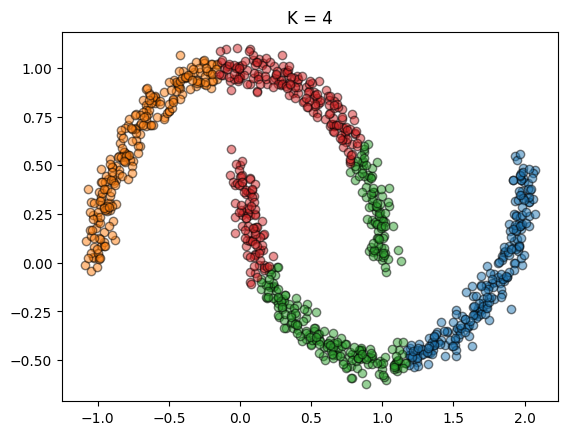

current K = 5
K = 5 : V = 271.19229275431405


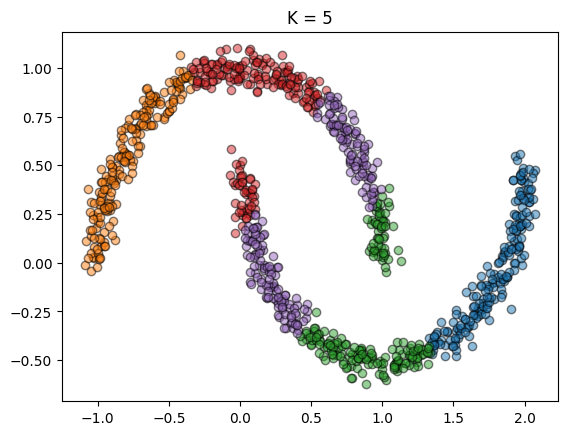

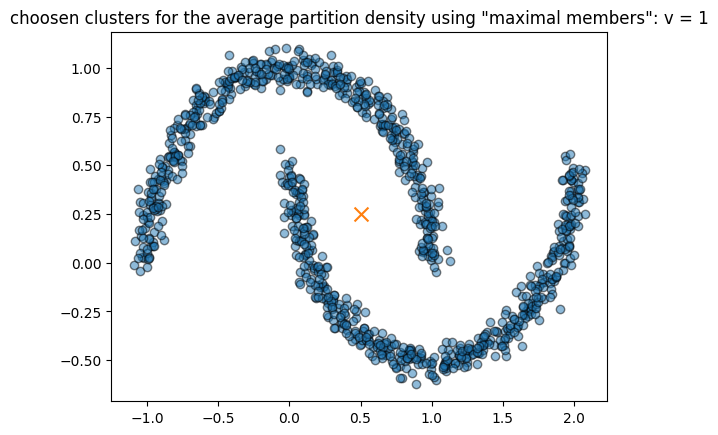

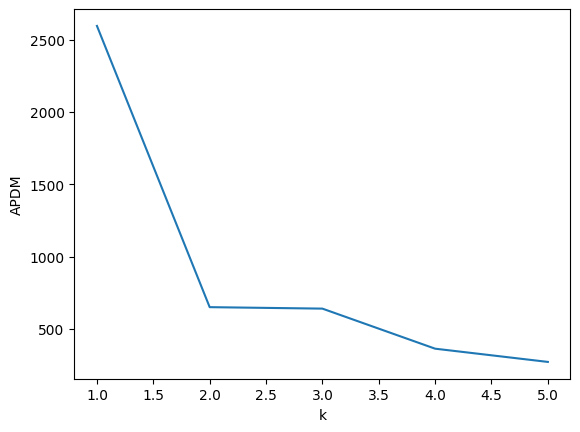

K = 1 : V = 2594.20890814978
K = 2 : V = 649.8493314426694
K = 3 : V = 639.6986156749531
K = 4 : V = 362.70676915874304
K = 5 : V = 271.19229275431405
K = 1 : V = 3.255122218110905e-31


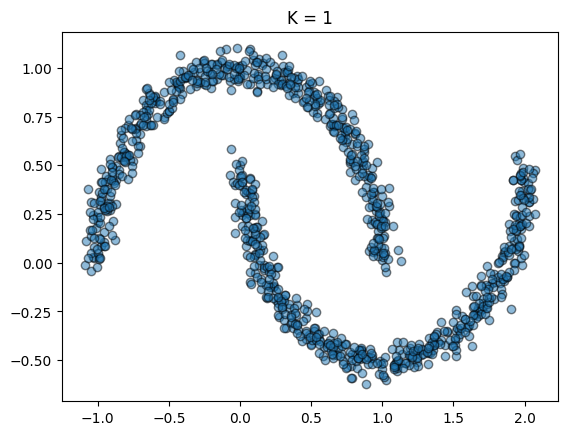

K = 2 : V = 3.2551222175145195e-31


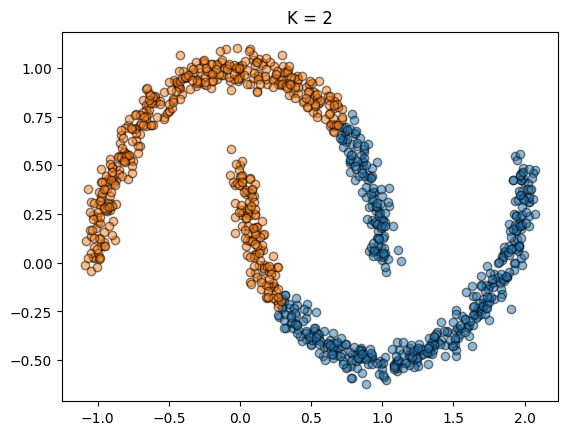

K = 3 : V = 7.448118058433957e-42


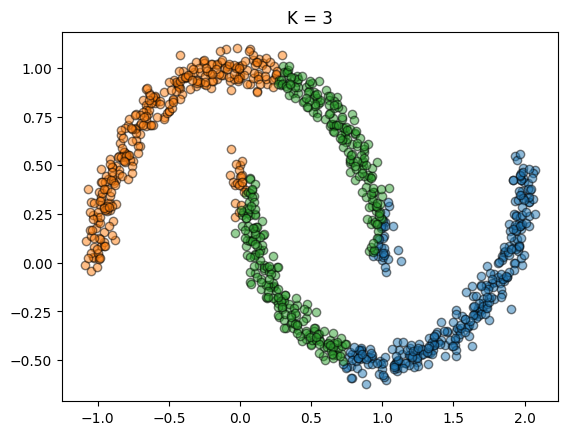

K = 4 : V = 2.35234331276418e-43


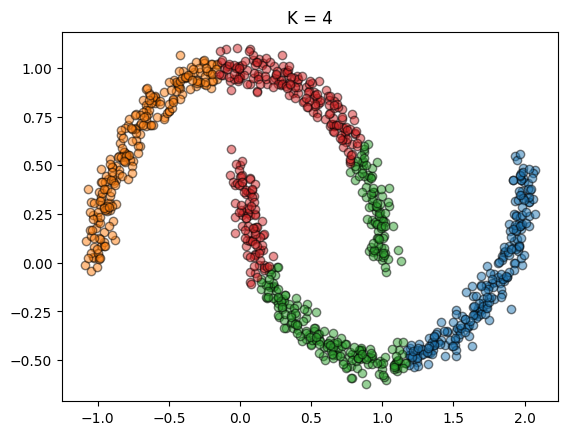

K = 5 : V = 2.986986150745275e-44


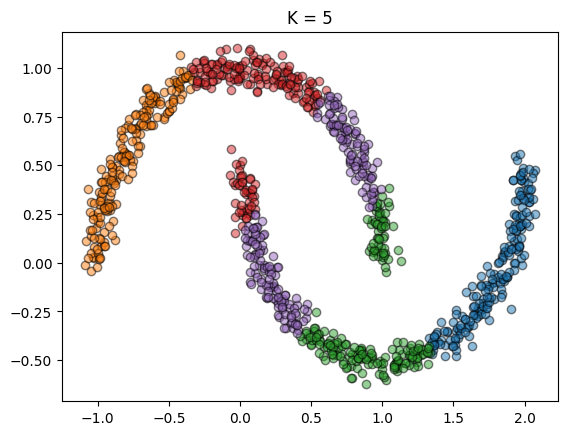

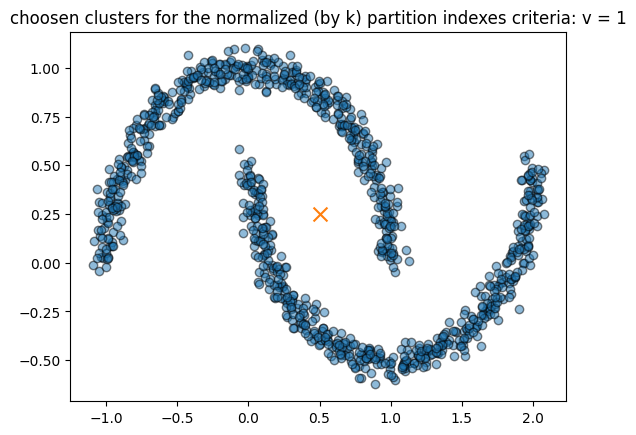

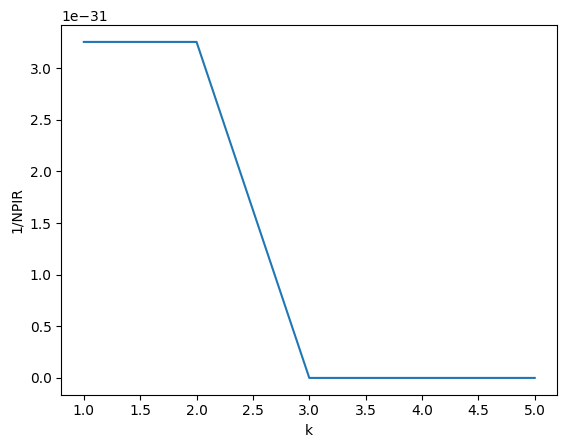

K = 1 : V = 3.255122218110905e-31
K = 2 : V = 3.2551222175145195e-31
K = 3 : V = 7.448118058433957e-42
K = 4 : V = 2.35234331276418e-43
K = 5 : V = 2.986986150745275e-44
K = 1 : V = inf


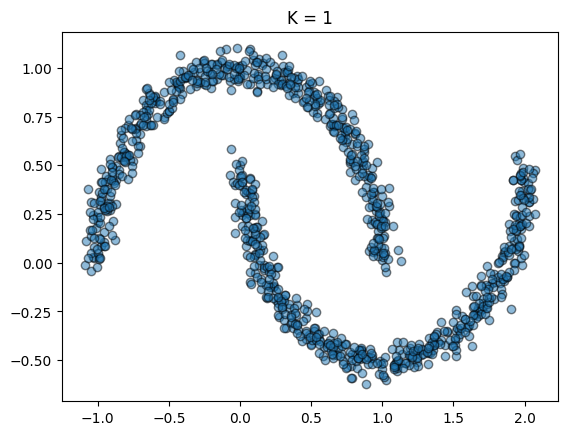

K = 2 : V = 4.380064463624208e-11


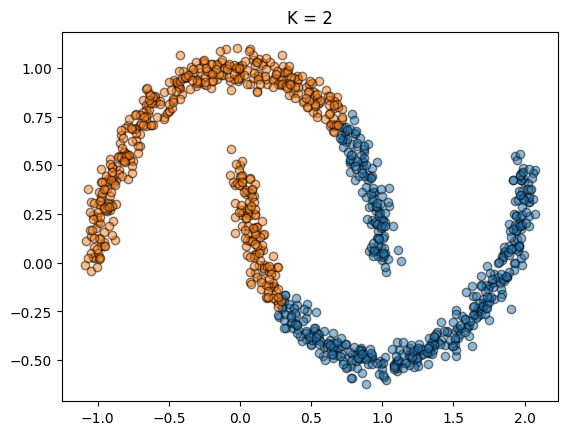

K = 3 : V = 11.716353598546803


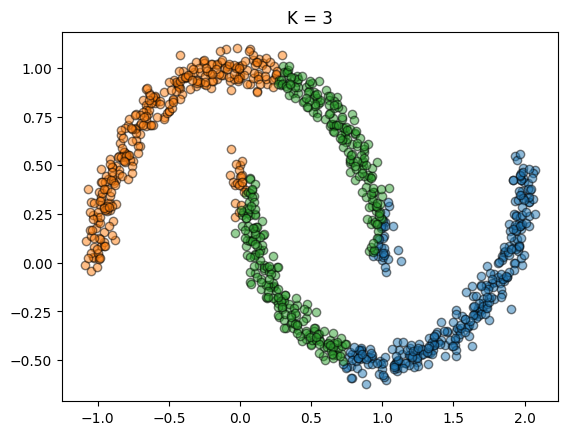

K = 4 : V = 19.181420510793913


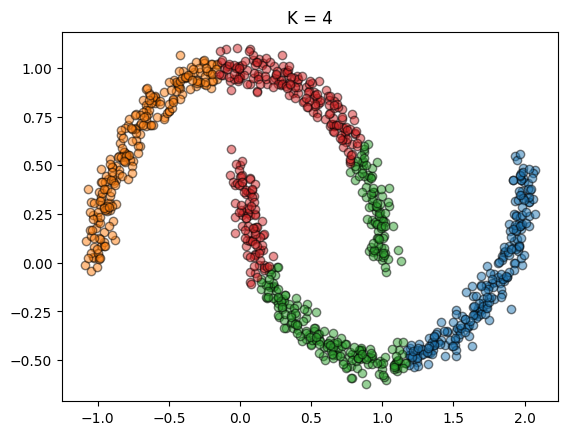

K = 5 : V = 23.90013970197422


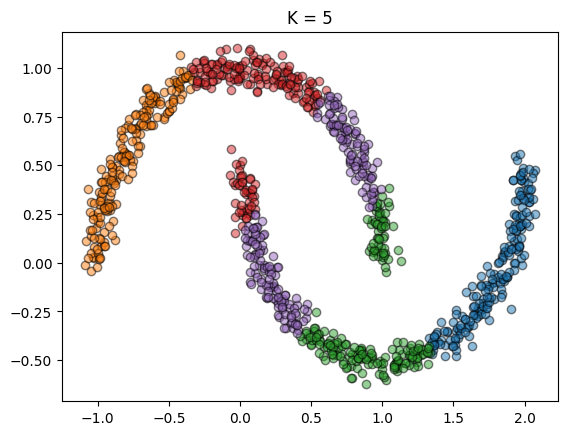

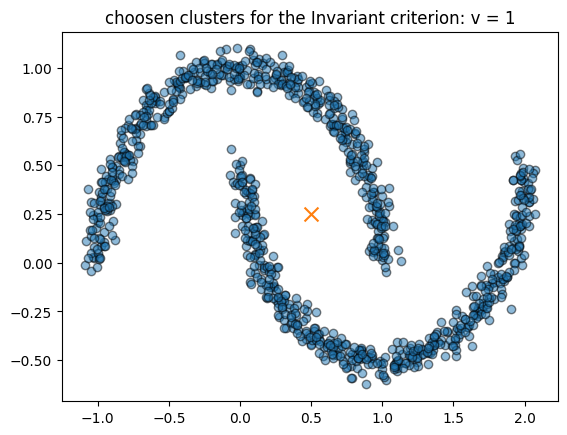

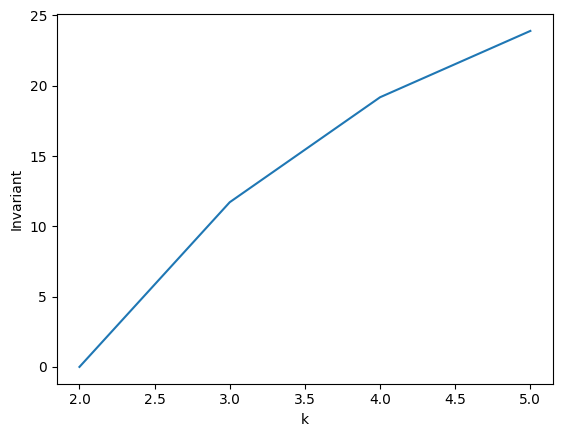

K = 1 : V = inf
K = 2 : V = 4.380064463624208e-11
K = 3 : V = 11.716353598546803
K = 4 : V = 19.181420510793913
K = 5 : V = 23.90013970197422


In [291]:
comper_criteria_WUOFC(moon_data, 6,[1,2,3,4,5])

3D data randomly

[0.47622939 0.26568902 0.25808159]
(array([0.30376765, 0.74671789, 0.31220184]), array([[ 0.25661303,  0.25840731, -0.19809453],
       [ 0.25840731,  0.51826729, -0.23894255],
       [-0.19809453, -0.23894255,  0.18027252]]))


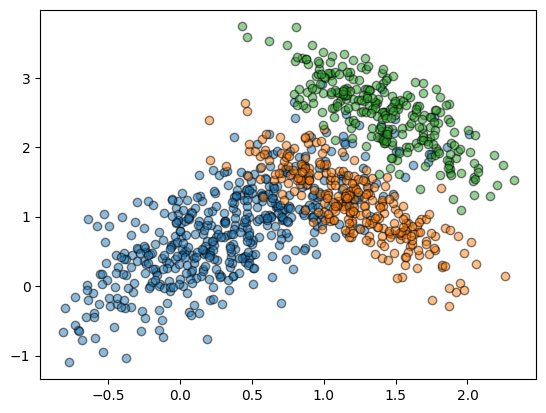

In [364]:
k = 3
d = 3
N = 1000
distance = 4
max_iters = 50
fuzziness = 2

clusters, data, phi, sigma = generate_clusters(K,d,N=N,distance=distance)
plot_clusters(clusters)


ValueError: 'c' argument has 1000 elements, which is inconsistent with 'x' and 'y' with size 999.

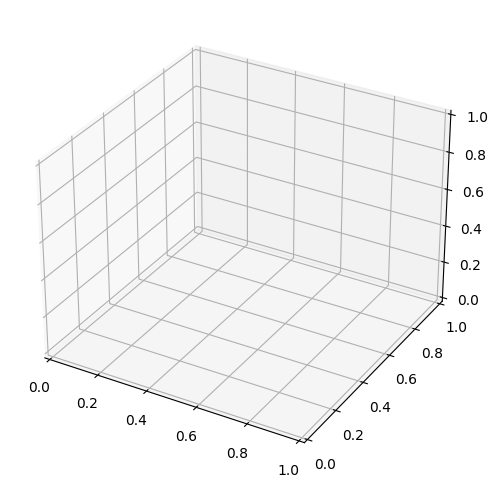

In [365]:
init = initial_model(data,k,d,'rand',phi=None,sigma=None)

phi, mu, sigma, lol ,pred= MLE(data,labels,init,'MLE Estimated for random data wuth 3 centers \n- random initialization',case=1)
plot_log_likelihood(lol)

<h2> uniformly spred data, shaped like a squre

mle estimation with random initialization

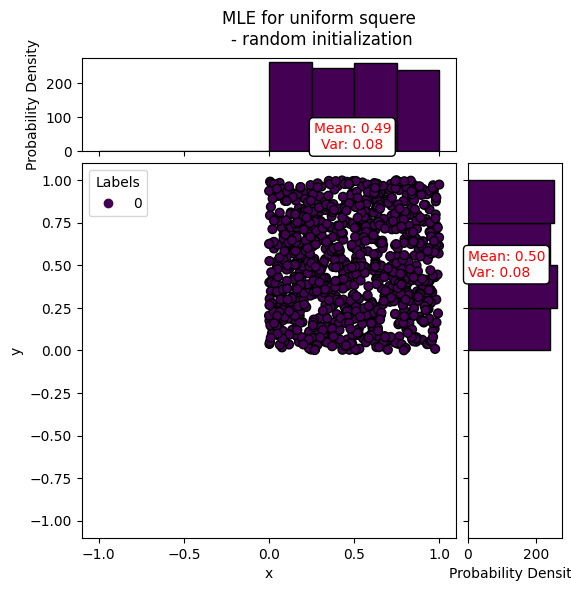

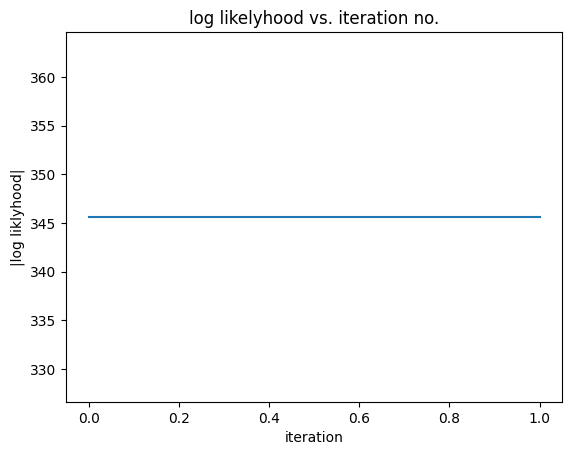

In [355]:
k=2
d=2
square = np.random.rand(1000, 2)
init1 = initial_model(square,k, d, 'rand', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(square,0, init1,'MLE for uniform squere \n- random initialization', case=1)
plot_log_likelihood(lol1)

mle estimation with kmeans initialization

In [356]:
init1 = initial_model(square,k, d, 'knn', phi=None, sigma=None)
phi1, mu1, sigma1, lol1, pred1 = MLE(square,0, init1,'MLE for uniform squere \n- KNN initialization', case=1)
plot_log_likelihood(lol1)

KeyboardInterrupt: 

AGG clustering

<h2> uniformly spred data, shaped like parallelogram

mle estimation with random initialization

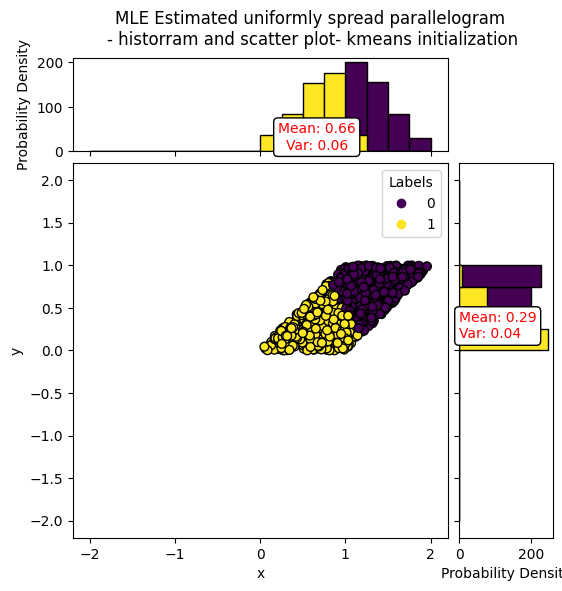

In [ ]:
parallelogram = np.random.rand(1000, 2)
parallelogram[:, 0] = parallelogram[:, 0] + parallelogram[:, 1]
pred1 =gauss_mle_cluster_case2( parallelogram, sigma, p, initial_type='rand')
scatter_plt( parallelogram, pred1, -1,
                                    'MLE Estimated uniformly spread parallelogram \n- historram and scatter plot- kmeans initialization')
    

mle estimation with kmeans initialization

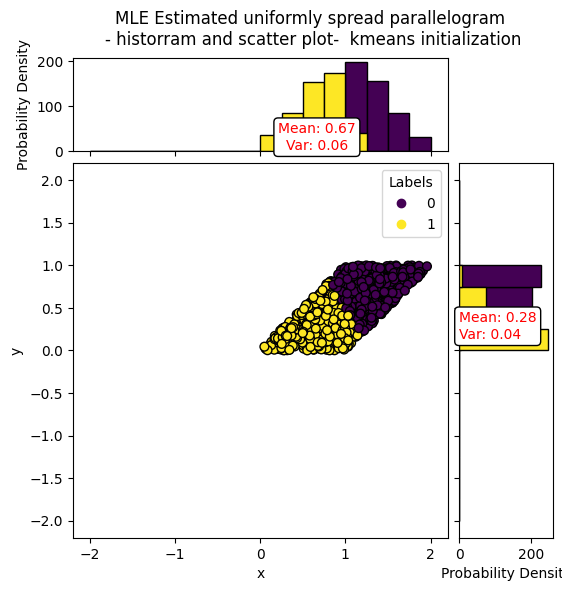

In [ ]:
pred2 =gauss_mle_cluster_case2( parallelogram, sigma, p, initial_type='kmeans')
scatter_plt( parallelogram, pred2, -1,
                                    'MLE Estimated uniformly spread parallelogram \n- historram and scatter plot-  kmeans initialization')
    

agg clustering

<h2> uniformly spred data, shaped like triangle

mle estimation with random initialization

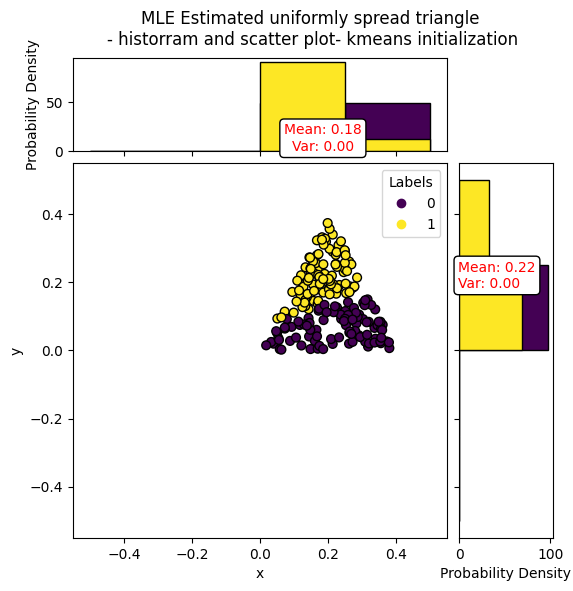

In [ ]:
v1 = np.array([0, 0])
v2 = np.array([0.2, 0.4])
v3 = np.array([0.4, 0])
u = np.random.uniform(size=(200, 1))
v = np.random.uniform(size=(200, 1))
triangle = (1 - np.sqrt(u)) * v1 + (np.sqrt(u) * (1 - v)) * v2 + (np.sqrt(u) * v) * v3
pred1 = gauss_mle_cluster_case2(triangle, sigma, p, initial_type='rand')
scatter_plt(triangle, pred1, -1,
                                    'MLE Estimated uniformly spread triangle \n- historram and scatter plot- kmeans initialization')
    

mle estimation with kmeans initialization

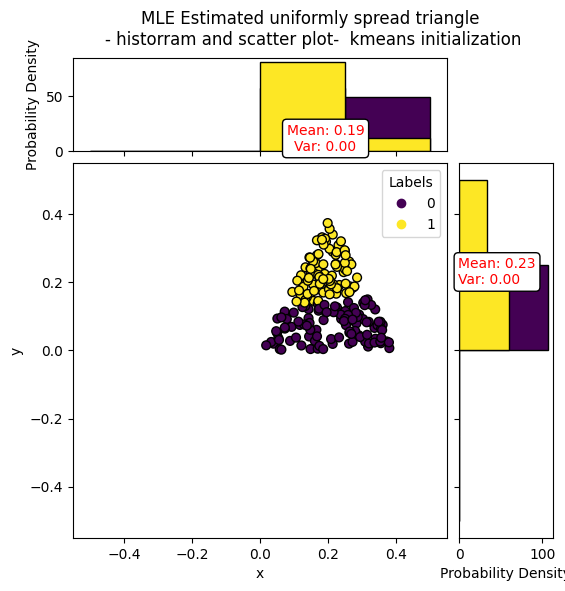

In [ ]:
pred2 =gauss_mle_cluster_case2(triangle, sigma, p, initial_type='kmeans')
scatter_plt(triangle, pred2, -1,
                                    'MLE Estimated uniformly spread triangle \n- historram and scatter plot-  kmeans initialization')
    

agg clustering